# PT Master Notebook
> This case study is *a framework for the basic implementation of pairs trading*. The z-score of the ratio is calculated, and trading signals are detected based on a set absolute deviation from the z-score, in standard deviations. The z-score is calculated as a rolling statistic. The last part performes the trading strategy.

Based on: [link](https://github.com/KidQuant/Pairs-Trading-With-Python/blob/master/PairsTrading.ipynb)

## Overview:
* [Defining functionality](#Defining-functionality)

### Data
* [Reading equity data](#Reading-data)
    * [Finland](#Finland)
    * [Canada](#Canada)
    * [France](#France)
    * [US](#US)
    * [UK](#UK)
    * [Italy](#Italy)
    * [Australia](#Australia)
    * [Austria](#Austria)
    * [China](#China)
    * [Chile](#Chile)
    * [Sweden](#Sweden)
    * [Denmark](#Denmark)
    
    
* [Reading factor correlations](#Reading-factor-correlations)

***
### Visualizing
* [Pair visualized](#Pair-visualized)

### Strategy
#### engineering
* [Trading signals](#Trading-signals)
* [Feature engineering](#Feature-engineering)
* [Assembling the model](#Assembling-the-model)
* [Strategy visualized](#Strategy-visualized)

#### Implementation
* [Implementation of strategy](#Implementation-of-strategy)
    * [TRADE_1 - Basic framework](#TRADE_1---Basic-framework)
    * [TRADE_2 - Function with additional trading rules](#TRADE_2---Function-with-additional-trading-rules)
     
#### Execution
* [Running strategy on several pairs](#Running-strategy-on-several-pairs)

#### Examining Results

* [Finland](#Finland-(TRADE))
* [Canada](#Canada-(TRADE))
* [France](#France-(TRADE))

In [14]:
import yfinance as yf
import pandas as pd
import numpy as np

import seaborn as sns; sns.set(style="darkgrid")
import matplotlib.pyplot as plt
import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller

from datetime import datetime, timedelta

from tqdm import tqdm_notebook as tqdm

import warnings
warnings.filterwarnings("ignore")

### Defining functionality

In [15]:
def calc_spread(S1, S2, sec_1, sec_2):
    """
    Function for calculating and plotting the spread of two securitites
    
    Parameters
    -----------
    
    S1, S2 : pandas Series
        Series of price data (Close)
        
    Returns
    -----------
    matplotlib figure
        plot visualising spread of two securities
    """
    S1 = sm.add_constant(S1)
    results = sm.OLS(S2, S1).fit()
    S1 = S1[sec_1]
    b = results.params[sec_1]
    spread = S2 - b * S1
    
    return spread

In [16]:
def calculate_and_plot_ratio(S1, S2):
    """
    calculates the ratio of two securities
    
    Parameters
    -----------
    
    S1, S2 : pandas Series
        Series of price data (Close)
        
    start, end: string
        start / end of the time interval
    
    Returns
    -----------
    matplotlib figure
        visualisation of the ratio, including a horisontal mean-line 
    
    """
    
    start = S1.index[0]
    end = S1.index[-1]
    
    ratio = S1 / S2
    ratio.plot(figsize=(12,6))
    plt.axhline(ratio.mean(), color='black', linestyle='--')  # zero-line
    plt.axhline(ratio.mean() + 0.1, color='red', linestyle='--', alpha = 0.6)  # upper line
    plt.axhline(ratio.mean() - 0.1, color='green', linestyle='--', alpha = 0.6)  # lower line
    plt.xlim(start, end)
    plt.legend(['Price Ratio'])
    plt.title(f'Ratio of {S1.name[:-3].upper()} and {S2.name[:-3].upper()}\n', loc='left', size='x-large')
    plt.xlabel(None)

In [17]:
def z_score(series):
    """
    Calculates z-scores for a given timeseries
    
    Parameters
    -----------
    series : Pandas timeseries
        time series
        
    Returns
    -----------
    Pandas timeseries
        z-scores of series
    """
    return (series - series.mean()) / np.std(series)


def plot_z_score(S1, S2):
    
    
    """
    Function for plotting z-score, including a lower and upper band s
    
    Parameters
    -----------
    
    S1, S2 : pandas Series
        Series of price data (Close)
        
    start, end: string
        start / end of the time interval
    
    Returns
    -----------
    matplotlib figure
        visualisation of the z-score, including a upper and lower band
    
    """
    
    start = S1.index[0]
    end = S1.index[-1]
    
    ratio = S1 / S2
    z_score(ratio).plot(figsize=(12,6), label = 'z-score')
    
    plt.axhline(z_score(ratio).mean(), color='k', linestyle = '-.', alpha=0.9, label='z-score mean')
    plt.axhline(1.0, color='red', linestyle = '--', alpha=0.9, label = 'upper border')
    plt.axhline(-1.0, color='green', linestyle = '--', alpha=0.9, label = ' lower border')
    plt.xlim(start, end)
    
    plt.xlabel('')
    plt.legend()
    plt.tight_layout()
    plt.title(f'z-score - {S1.name[:-3]} and {S2.name[:-3]}\n'.upper(), loc='left', size = 'x-large')
    plt.show()

## Reading data

### Finland

In [278]:
FINLAND_PAIRS_LIST = pd.ExcelFile('Finland_Pairs.xlsx').sheet_names
FINLAND_PAIRS_LIST = [pair for pair in FINLAND_PAIRS_LIST if not pair.endswith('EIEND')]
FINLAND_PAIRS_LIST

['STORA - STORE',
 'NELES - TOMRA',
 'PONSS - ATEA',
 'FISKA - YARA ',
 'TIETO - ORKLA',
 'UPM-K - BAKKA',
 'KONEC - ATEA',
 'AKTIA - YARA ',
 'ASPO - ATEA',
 'KEMIR - BAKKA']

In [381]:
test_pair = pd.read_excel('Finland_Pairs.xlsx',
                     sheet_name = FINLAND_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,NELES,TOMRA SYSTEMS
Name,,
2013-01-02,16248.728275,383.46
2013-01-03,16258.805445,372.35
2013-01-04,16280.419500,369.76
2013-01-07,16160.068340,370.50
2013-01-08,15940.288000,363.09
...,...,...
2022-02-23,52404.268155,3545.35
2022-02-24,50689.379196,3455.58
2022-02-25,52079.415408,3629.09


### Canada

In [306]:
CANADA_PAIRS_LIST = pd.ExcelFile('Canada_Pairs.xlsx').sheet_names
CANADA_PAIRS_LIST = [pair for pair in CANADA_PAIRS_LIST if not pair.endswith('EIEND')]
CANADA_PAIRS_LIST

['CAE - ATEA',
 'CAE - MOWI',
 'SUN L - GJENS',
 'INTAC - GJENS',
 'CANAD - GJENS',
 'PEMBI - MOWI',
 'METRO - AF GR',
 'MANUL - ATEA',
 'CONST - TOMRA',
 'TELUS - GJENS',
 'CGI - MOWI',
 'BROOK - GJENS',
 'PEMBI - LEROY',
 'ALIME - AF GR',
 'BCE - AF GR',
 'WESTO - VEIDE',
 'OPEN  - BAKKA',
 'SHAW  - YARA ',
 'ROGER - MOWI']

In [392]:
test_pair = pd.read_excel('Canada_Pairs.xlsx',
                     sheet_name = CANADA_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,CAE,MOWI
Name,,
2013-01-02,101853.743290,3.54
2013-01-03,101668.434431,3.52
2013-01-04,102880.824585,3.48
2013-01-07,102985.110900,3.43
2013-01-08,101929.054710,3.44
...,...,...
2022-02-23,436609.525716,25.22
2022-02-24,451667.191185,24.12
2022-02-25,463523.132478,25.13


### France

In [337]:
FRANCE_PAIRS_LIST = pd.ExcelFile('France_Pairs.xlsx').sheet_names
FRANCE_PAIRS_LIST = [pair for pair in FRANCE_PAIRS_LIST if not pair.endswith('EIEND')]
FRANCE_PAIRS_LIST

['CAPGE - YARA ',
 'REMY  - DNB B',
 'VINCI - MOWI',
 'ENGIE - ORKLA',
 'BUREA - DNB B',
 'VINCI - ORKLA',
 'TELEP - TOMRA',
 'LVMH - TOMRA',
 'EIFFA - ORKLA',
 'TOTAL - AUSTE',
 'BUREA - ATEA',
 'SAFRA - TELEN']

In [397]:
test_pair = pd.read_excel('France_Pairs.xlsx',
                     sheet_name = FRANCE_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,REMY COINTREAU,DNB BANK
Name,,
2013-01-02,3969.743750,1879.65
2013-01-03,4041.386790,1879.65
2013-01-04,4012.844220,1905.76
2013-01-07,4052.784320,1905.76
2013-01-08,4085.431350,1909.67
...,...,...
2022-02-23,13019.569935,7691.81
2022-02-24,12807.975270,7150.63
2022-02-25,13140.458856,7364.50


In [446]:
test_pair.iloc[:,1].name

'DNB BANK'

### US

In [5]:
US_PAIRS_LIST = pd.ExcelFile('US_Pairs.xlsx').sheet_names
US_PAIRS_LIST

<IPython.core.display.Javascript object>

['ADOBE - TOMRA',
 'PFIZE - AF GR',
 'ORACL - YARA ',
 'JOHNS - AF GR',
 'CISCO - MOWI',
 'BANK  - ATEA',
 'PFIZE - DNB B',
 'JOHNS - EIEND',
 'SALES - TOMRA',
 'META  - BAKKA',
 'INTEL - BAKKA',
 'RAYTH - MOWI',
 'HOME  - GJENS',
 'VERIZ - EIEND',
 'COMCA - AF GR',
 'NIKE  - TOMRA',
 'BANK  - DNB B',
 'AMERI - TOMRA',
 'PFIZE - MOWI',
 'COMCA - BAKKA',
 'UNITE - BORRE',
 'ABBOT - TOMRA']

In [11]:
pair = pd.read_excel('US_Pairs.xlsx',
                     sheet_name = US_PAIRS_LIST[1],
                     index_col = 'Name')
pair

<IPython.core.display.Javascript object>

,PFIZER,AF GRUPPEN 'A'
Name,,
2013-01-02,50312.787360,1948.42
2013-01-03,50629.351348,1965.66
2013-01-04,51248.600280,1948.42
2013-01-07,51231.402368,1957.04
2013-01-08,51262.677360,1965.66
...,...,...
2022-02-23,215099.698432,12408.99
2022-02-24,215502.105856,12092.68
2022-02-25,220221.295758,12165.68


### UK

In [29]:
UK_PAIRS_LIST = pd.ExcelFile('UK_Pairs.xlsx').sheet_names
UK_PAIRS_LIST

['LEGAL - YARA ',
 'PERSI - BAKKA',
 'BARRA - BAKKA',
 'BUNZL - VEIDE',
 'RIGHT - BAKKA',
 'NATIO - VEIDE',
 'BURBE - DNB B']

In [31]:
test_pair = pd.read_excel('US_Pairs.xlsx',
                     sheet_name = US_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,PFIZER,AF GRUPPEN 'A'
Name,,
2013-01-02,50312.787360,1948.42
2013-01-03,50629.351348,1965.66
2013-01-04,51248.600280,1948.42
2013-01-07,51231.402368,1957.04
2013-01-08,51262.677360,1965.66
...,...,...
2022-02-23,215099.698432,12408.99
2022-02-24,215502.105856,12092.68
2022-02-25,220221.295758,12165.68


### Italy

In [39]:
ITALY_PAIRS_LIST = pd.ExcelFile('Italy_Pairs.xlsx').sheet_names
ITALY_PAIRS_LIST

['A2A - MOWI',
 'AMPLI - TOMRA',
 'BRUNE - AKER',
 'SNAM - AF GR',
 'TERNA - GJENS',
 'SNAM - GJENS',
 'BANCA - YARA ',
 'EXOR  - ATEA',
 'ASCOP - ORKLA',
 'MEDIO - ATEA',
 'SAIPE - NORWA',
 'BRUNE - DNB B',
 'ACEA - BAKKA']

In [40]:
test_pair = pd.read_excel('Italy_Pairs.xlsx',
                     sheet_name = ITALY_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,AMPLIFON,TOMRA SYSTEMS
Name,,
2013-01-02,1528.845275,383.46
2013-01-03,1491.840900,372.35
2013-01-04,1444.399110,369.76
2013-01-07,1423.647160,370.50
2013-01-08,1410.818045,363.09
...,...,...
2022-02-23,20666.702295,3545.35
2022-02-24,21188.515998,3455.58
2022-02-25,21358.358136,3629.09


### Australia

In [41]:
AUSTRALIA_PAIRS_LIST = pd.ExcelFile('AUSTRALIA_Pairs.xlsx').sheet_names
AUSTRALIA_PAIRS_LIST

['QBE I - BORRE',
 'QBE I - STORE',
 'QBE I - BONHE',
 'QBE I - LEROY',
 'NEWCR - NORWA',
 'QBE I - AUSTE',
 'QBE I - TOMRA',
 'JAMES - BORRE',
 'QBE I - SCHIB',
 'COCHL - MOWI',
 'QBE I - SALMA',
 'QBE I - NORSK',
 'COCHL - LEROY',
 'QBE I - BAKKA',
 'QBE I - AKER',
 'QBE I - EQUIN',
 'ALUMI - AKER ',
 'ATLAS - MOWI',
 'QBE I - MOWI',
 'TRANS - ORKLA',
 'QBE I - ATEA',
 'QBE I - KONGS',
 'QBE I - AREND',
 'COCHL - BAKKA',
 'ARIST - ATEA',
 'COMPU - STORE',
 'QBE I - YARA ',
 'ARGO  - GJENS',
 'SONIC - GJENS',
 'COMMO - YARA ',
 'QBE I - DNB B',
 'QBE I - VEIDE',
 'MACQU - SALMA',
 'GOODM - TOMRA']

In [42]:
test_pair = pd.read_excel('Australia_Pairs.xlsx',
                     sheet_name = AUSTRALIA_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,QBE INSURANCE GROUP,STOREBRAND
Name,,
2013-01-02,78036.368110,529.19
2013-01-03,80830.665236,533.95
2013-01-04,80638.352820,548.22
2013-01-07,82817.912980,544.42
2013-01-08,80999.651196,546.32
...,...,...
2022-02-23,129732.045300,2000.43
2022-02-24,125756.919862,1857.07
2022-02-25,124365.224665,1962.94


### Austria

In [43]:
AUSTRALIA_PAIRS_LIST = pd.ExcelFile('AUSTRALIA_Pairs.xlsx').sheet_names
AUSTRALIA_PAIRS_LIST

['QBE I - BORRE',
 'QBE I - STORE',
 'QBE I - BONHE',
 'QBE I - LEROY',
 'NEWCR - NORWA',
 'QBE I - AUSTE',
 'QBE I - TOMRA',
 'JAMES - BORRE',
 'QBE I - SCHIB',
 'COCHL - MOWI',
 'QBE I - SALMA',
 'QBE I - NORSK',
 'COCHL - LEROY',
 'QBE I - BAKKA',
 'QBE I - AKER',
 'QBE I - EQUIN',
 'ALUMI - AKER ',
 'ATLAS - MOWI',
 'QBE I - MOWI',
 'TRANS - ORKLA',
 'QBE I - ATEA',
 'QBE I - KONGS',
 'QBE I - AREND',
 'COCHL - BAKKA',
 'ARIST - ATEA',
 'COMPU - STORE',
 'QBE I - YARA ',
 'ARGO  - GJENS',
 'SONIC - GJENS',
 'COMMO - YARA ',
 'QBE I - DNB B',
 'QBE I - VEIDE',
 'MACQU - SALMA',
 'GOODM - TOMRA']

In [44]:
test_pair = pd.read_excel('Australia_Pairs.xlsx',
                     sheet_name = AUSTRALIA_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,QBE INSURANCE GROUP,STOREBRAND
Name,,
2013-01-02,78036.368110,529.19
2013-01-03,80830.665236,533.95
2013-01-04,80638.352820,548.22
2013-01-07,82817.912980,544.42
2013-01-08,80999.651196,546.32
...,...,...
2022-02-23,129732.045300,2000.43
2022-02-24,125756.919862,1857.07
2022-02-25,124365.224665,1962.94


### Hong Kong

In [45]:
HK_PAIRS_LIST = pd.ExcelFile('HK_Pairs.xlsx').sheet_names
HK_PAIRS_LIST

['CLP H - EIEND',
 'SUN H - TELEN',
 'CHINA - NORSK',
 'CHINA - BAKKA',
 'MTR - EIEND',
 'LONGF - TOMRA',
 'HONG  - SCHIB',
 'CHINA - TOMRA',
 'AIA G - BAKKA',
 'CNOOC - GRIEG',
 'HENDE - EIEND',
 'ENN E - SALMA']

In [46]:
test_pair = pd.read_excel('HK_Pairs.xlsx',
                     sheet_name = HK_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,SUN HUNG KAI PROPERTIES,TELENOR
Name,,
2013-01-02,54286.781661,376.75
2013-01-03,54244.993340,379.08
2013-01-04,55178.979084,381.41
2013-01-07,56285.630152,380.41
2013-01-08,55906.628632,382.41
...,...,...
2022-02-23,98202.660954,728.17
2022-02-24,98835.871848,693.82
2022-02-25,95952.020154,707.07


### Japan

In [47]:
JAPAN_PAIRS_LIST = pd.ExcelFile('Japan_Pairs.xlsx').sheet_names
JAPAN_PAIRS_LIST

['HONDA - ATEA',
 'KYOCE - MOWI',
 'HONDA - MOWI',
 'TOKIO - MOWI',
 'HONDA - KONGS',
 'SUMIT - DNB B',
 'MITSU - DNB B',
 'HONDA - YARA ',
 'BRIDG - ATEA',
 'HOYA - TOMRA',
 'SUMIT - MOWI',
 'SUMIT - ATEA',
 'TERUM - BAKKA',
 'TOYOT - YARA ',
 'HONDA - DNB B',
 'HONDA - VEIDE',
 'HONDA - BORRE',
 'HONDA - TOMRA',
 'HONDA - LEROY',
 'KUBOT - ATEA',
 'HONDA - SALMA',
 'NIPPO - AF GR',
 'HONDA - BAKKA',
 'ASTEL - BAKKA',
 'SUMIT - AF GR',
 'BRIDG - AF GR',
 'SUMIT - STORE',
 'SUMIT - LEROY',
 'SUMIT - AUSTE',
 'ORIX - DNB B',
 'KDDI - AF GR',
 'HONDA - AREND',
 'HONDA - AF GR',
 'SUMIT - AKER',
 'MIZUH - EIEND',
 'DAI-I - YARA ']

In [48]:
test_pair = pd.read_excel('Japan_Pairs.xlsx',
                     sheet_name = JAPAN_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,KYOCERA,MOWI
Name,,
2013-01-02,175.661583,3.54
2013-01-03,177.265280,3.52
2013-01-04,182.421405,3.48
2013-01-07,180.176354,3.43
2013-01-08,179.164298,3.44
...,...,...
2022-02-23,433.698260,25.22
2022-02-24,434.036165,24.12
2022-02-25,431.114251,25.13


### China

In [49]:
CHINA_PAIRS_LIST = pd.ExcelFile('China_Pairs.xlsx').sheet_names
CHINA_PAIRS_LIST

['CHINA - AF GR',
 'INDUS - VEIDE',
 'AGRIC - EIEND',
 'INDUS - EIEND',
 'CHINA - YARA ',
 'CHINA - DNB B',
 "BYD ' - NORDI"]

In [50]:
test_pair = pd.read_excel('China_Pairs.xlsx',
                     sheet_name = CHINA_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,INDUSTRIAL BANK 'A',VEIDEKKE
Name,,
2013-01-02,139.498668,5014.19
2013-01-03,140.633316,4969.32
2013-01-04,142.724559,4991.75
2013-01-07,147.404263,5002.97
2013-01-08,144.517510,5014.19
...,...,...
2022-02-23,638.610000,25555.25
2022-02-24,646.532000,25009.86
2022-02-25,631.301216,25204.64


### Chile

In [51]:
CHILE_PAIRS_LIST = pd.ExcelFile('Chile_Pairs.xlsx').sheet_names
CHILE_PAIRS_LIST

['VINA  - TELEN', 'EMPRE - GJENS']

In [53]:
test_pair = pd.read_excel('Chile_Pairs.xlsx',
                     sheet_name = CHILE_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,EMPRESA NACIONAL DE TELECOMUNICA,GJENSIDIGE FORSIKRING
Name,,
2013-01-02,4182.03,159.65
2013-01-03,4166.56,159.65
2013-01-04,4172.94,158.48
2013-01-07,4180.80,157.70
2013-01-08,4214.10,159.16
...,...,...
2022-02-23,1890.41,779.39
2022-02-24,1813.40,761.55
2022-02-25,1867.43,787.03


### Sweden

In [54]:
SWEDEN_PAIRS_LIST = pd.ExcelFile('Sweden_Pairs.xlsx').sheet_names
SWEDEN_PAIRS_LIST

['AXFOO - AF GR',
 'AXFOO - GJENS',
 'LUNDI - SALMA',
 'ASSA  - AF GR',
 'HUSQV - BORRE',
 'SKAND - YARA ',
 'SWEDI - LEROY',
 'FABEG - MOWI',
 'DIOS  - MOWI',
 'DIOS  - GJENS',
 'SWEDI - NORWA',
 'HUFVU - EIEND',
 'CATEN - TOMRA',
 'SKAND - BORRE',
 'SECUR - EIEND']

In [81]:
pair = pd.read_excel('Sweden_Pairs.xlsx',
                     sheet_name = SWEDEN_PAIRS_LIST[1],
                     index_col = 'Name')
pair

,AXFOOD,GJENSIDIGE FORSIKRING
Name,,
2013-01-02,503.255334,159.65
2013-01-03,505.680126,159.65
2013-01-04,506.746212,158.48
2013-01-07,507.617636,157.70
2013-01-08,505.857807,159.16
...,...,...
2022-02-23,3190.152712,779.39
2022-02-24,3130.971894,761.55
2022-02-25,3190.975824,787.03


### Denmark

In [56]:
DENMARK_PAIRS_LIST = pd.ExcelFile('Denmark_Pairs.xlsx').sheet_names
DENMARK_PAIRS_LIST

['BANKN - KONGS',
 'DEMAN - ATEA',
 'AALBO - GOLAR',
 'NOVOZ - YARA ',
 'ATLAN - FRONT',
 'DEMAN - DNB B',
 'DEMAN - STORE',
 'AALBO - DNO',
 'DEMAN - AKER',
 'ROYAL - TOMRA',
 'UTD.I - DNB B',
 'DSV - TOMRA']

In [57]:
test_pair = pd.read_excel('Denmark_Pairs.xlsx',
                     sheet_name = DENMARK_PAIRS_LIST[1],
                     index_col = 'Name')
test_pair

,DEMANT,ATEA
Name,,
2013-01-02,2331.667963,73.85
2013-01-03,2333.825946,73.24
2013-01-04,2352.666260,73.54
2013-01-07,2338.601526,73.24
2013-01-08,2331.177885,73.54
...,...,...
2022-02-23,8758.190016,315.36
2022-02-24,8730.972376,306.12
2022-02-25,8710.837100,304.74


## Reading factor correlations

In [61]:
equities_NO = ['EQUINOR', 'DNB BANK', 'TELENOR', 'NORSK HYDRO', 'AKER BP', 'MOWI',
               'YARA INTERNATIONAL', 'AKER', 'DNO', 'GJENSIDIGE FORSIKRING',
               'GRIEG SEAFOOD', 'ORKLA', 'SALMAR', 'SCHIBSTED A', 'TOMRA SYSTEMS',
               "AF GRUPPEN 'A'", 'ARENDALS FOSSEKOMPANI', 'ATEA', 'AUSTEVOLL SEAFOOD',
               'BAKKAFROST', 'BONHEUR', 'BORREGAARD', 'EIENDOMSSPAR', 'FRONTLINE',
               'GOLAR LNG (NAS)', 'KONGSBERG GRUPPEN', 'LEROY SEAFOOD GROUP', 'NEL',
               'NORDIC SEMICONDUCTOR', 'NORWAY ROYAL SALMON', 'NORWEGIAN AIR SHUTTLE',
               'PROTECTOR FORSIKRING', 'STOREBRAND', 'SUBSEA 7', 'VEIDEKKE',
               'WALLENIUS WILHELMSEN']

In [270]:
pd.ExcelFile('NO_factor_correlations_50.xlsx').sheet_names
factor_corr_200['EIENDOMSSPAR']

,WTI Crude Oil,Gold Bullion,Brent Europe,Copper,Aluminium,Baltic Dry Index,Natural Gas - RFV,Fish Pool Spot,Silver,VLCC,10Y NO,10Y US,10Y UK
Date,,,,,,,,,,,,,
2013-10-10,-0.025387,0.027968,-0.021745,-0.028011,0.000499,-0.103377,0.002046,0.082146,0.015290,0.034016,0.069063,0.027084,0.072864
2013-10-11,-0.025388,0.027861,-0.021741,-0.027950,0.000621,-0.103184,0.002031,0.081994,0.015323,0.034016,0.069097,0.027104,0.072901
2013-10-14,-0.025369,0.027850,-0.021749,-0.027883,0.000584,-0.103015,0.002031,0.081994,0.015323,0.034016,0.069105,0.027106,0.073025
2013-10-15,-0.025351,0.027798,-0.021748,-0.027895,0.000528,-0.103598,0.001990,0.081994,0.015273,0.034022,0.069102,0.027115,0.073192
2013-10-16,-0.025259,0.027795,-0.021744,-0.027879,0.000526,-0.103657,0.001956,0.081994,0.015286,0.033787,0.068905,0.027036,0.073183
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-23,-0.067702,0.002985,-0.060917,0.085956,-0.052333,0.162150,-0.034356,-0.139849,-0.040909,0.043088,-0.010200,-0.087470,-0.101109
2022-02-24,-0.067864,0.003048,-0.061148,0.085962,-0.051719,0.161909,-0.029878,-0.139849,-0.040843,0.041923,-0.010230,-0.087694,-0.101019
2022-02-25,-0.067852,0.002900,-0.061388,0.086215,-0.051685,0.161031,-0.028639,-0.141195,-0.040605,0.033652,-0.010026,-0.087668,-0.100996


In [99]:
### 20-day rolling correlations

factor_corr_20 = {}

for eqt in equities_NO:
    
    if eqt == "AF GRUPPEN 'A'":
        eqt = "AF GRUPPEN A"
        
    factor_corr_20[eqt] = pd.read_excel('NO_factor_correlations_20.xlsx',
                               sheet_name = eqt,
                               index_col  = 'Date')

### 50-day rolling correlations
    
factor_corr_50 = {}

for eqt in equities_NO:
    
    if eqt == "AF GRUPPEN 'A'":
        eqt = "AF GRUPPEN A"
        
    factor_corr_50[eqt] = pd.read_excel('NO_factor_correlations_50.xlsx',
                               sheet_name = eqt,
                               index_col  = 'Date')
    

### 100-day rolling correlations
factor_corr_100 = {}

for eqt in equities_NO:
    
    if eqt == "AF GRUPPEN 'A'":
        eqt = "AF GRUPPEN A"
        
    factor_corr_100[eqt] = pd.read_excel('NO_factor_correlations_100.xlsx',
                               sheet_name = eqt,
                               index_col  = 'Date')
    

### 200-day rolling correlations   
factor_corr_200 = {}

for eqt in equities_NO:
    
    if eqt == "AF GRUPPEN 'A'":
        eqt = "AF GRUPPEN A"
        
    factor_corr_200[eqt] = pd.read_excel('NO_factor_correlations_200.xlsx',
                               sheet_name = eqt,
                               index_col  = 'Date')

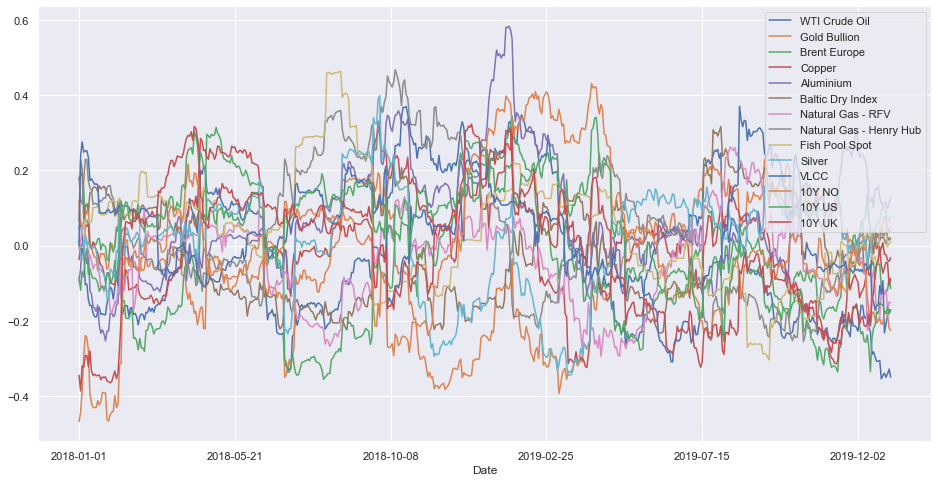

In [65]:
factor_corr_50['ORKLA']['2018':'2020'].plot(figsize=(16,8))
plt.show()

#### Example - EQUINOR & BRENT

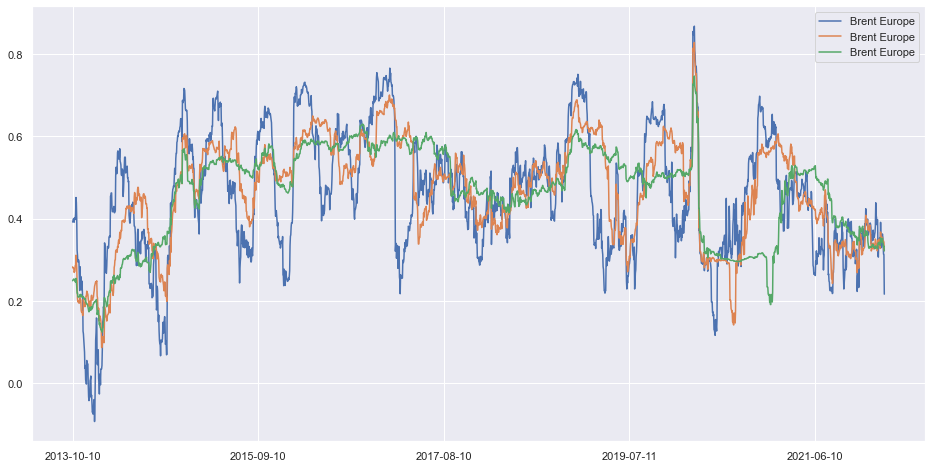

In [66]:
factor_corr_50 = pd.read_excel('NO_factor_correlations_50.xlsx',
                               sheet_name='EQUINOR',
                               index_col = 'Date')

factor_corr_100 = pd.read_excel('NO_factor_correlations_100.xlsx',
                                sheet_name='EQUINOR',
                                index_col = 'Date')

factor_corr_200 = pd.read_excel('NO_factor_correlations_200.xlsx',
                                sheet_name='EQUINOR',
                                index_col = 'Date')

pd.concat([factor_corr_50['Brent Europe'][150:],
           factor_corr_100['Brent Europe'][100:],
           factor_corr_200['Brent Europe']], axis=1).plot(figsize=(16,8))
plt.xlabel('')
plt.show()

### Pair visualized

In [83]:
pair

,AXFOOD,GJENSIDIGE FORSIKRING
Name,,
2013-01-02,503.255334,159.65
2013-01-03,505.680126,159.65
2013-01-04,506.746212,158.48
2013-01-07,507.617636,157.70
2013-01-08,505.857807,159.16
...,...,...
2022-02-23,3190.152712,779.39
2022-02-24,3130.971894,761.55
2022-02-25,3190.975824,787.03


#### Spread

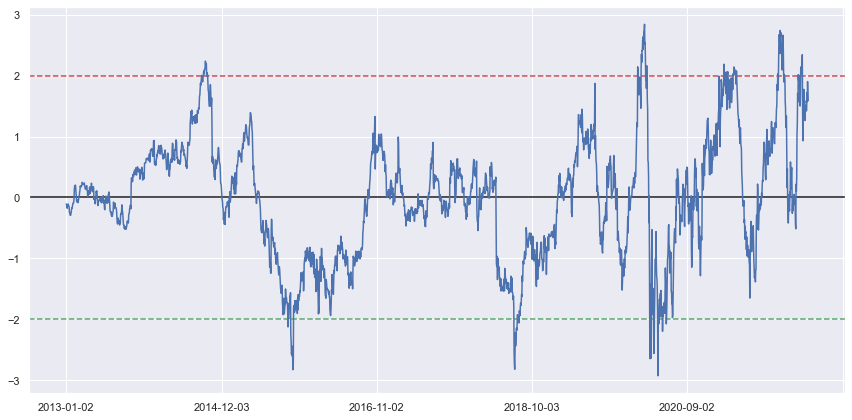

In [84]:
S1 = pair.iloc[:,0]
S2 = pair.iloc[:,1]

spread = calc_spread(S1, S2, S1.name, S2.name)

spread_z = (spread - spread.mean()) / spread.std()

plt.axhline(y=0, c='k')
plt.axhline(y=2, c='r', ls='--')
plt.axhline(y=-2, c='g', ls='--')

spread_z.plot(figsize=(12,6));
plt.xlabel('')
plt.tight_layout()
plt.show()

#### Ratio

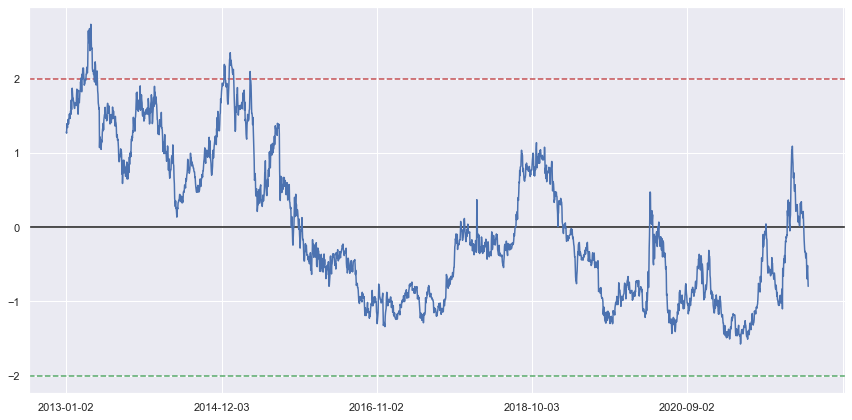

In [69]:
ratio = S1 / S2

ratio_z = (ratio - ratio.mean()) / ratio.std()

plt.axhline(y=0, c='k')
plt.axhline(y=2, c='r', ls='--')
plt.axhline(y=-2, c='g', ls='--')

ratio_z.plot(figsize=(12,6))
plt.xlabel('')
plt.tight_layout()
plt.show()

#### Cointegration

In [70]:
score, pvalue, _ = coint(S1, S2)
print(f'{pvalue:.4f}')

0.0069


#### Plotting the pair - Normalizing for easier comparison

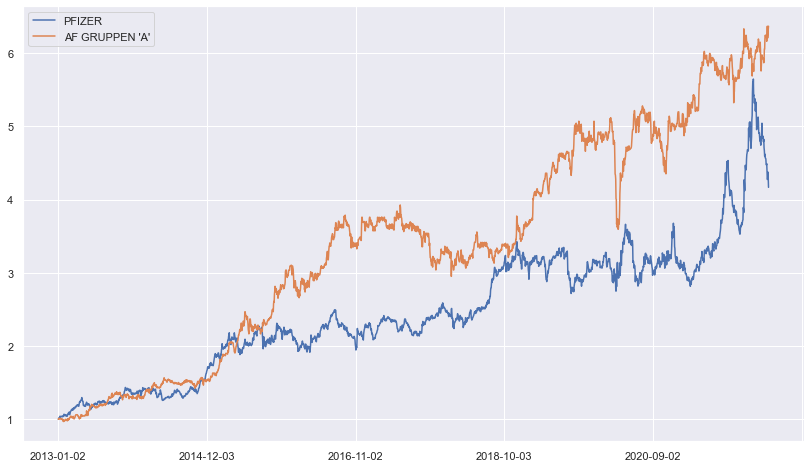

In [71]:
pair1 = pair / pair.iloc[0]

pair1.plot(figsize=(14,8))
plt.xlabel('')
plt.show()

## Trading signals

In [496]:
### Train test Split

split = int(len(ratio_z) * 0.70)
print(f'{split=}')

assert (pair.index == ratio_z.index).sum() == len(pair), "nul-values present in ratio_z division"
assert  ratio_z.isnull().sum() == 0, "nul-values present"

train = ratio_z[:split]
test = ratio_z[split:]

print(ratio_z.shape)
print(pair.shape)

split=1673
(2390,)
(2390, 2)


### Feature engineering

In [73]:
### calculating MAs and zscore

# 1
MA10_ratio = train.rolling(window=10, center=False).mean()

# 2
MA60_ratio = train.rolling(window=60, center=False).mean()

# 2
STD_ratio = train.rolling(window=60, center=False).std()[60:]
STD_ratio_rev = train.rolling(window=10, center=False).std()[10:]

# (1 - 2) / 2
ZSCORE_10_60 = (MA10_ratio - MA60_ratio) / STD_ratio
ZSCORE_reversed = (MA60_ratio - MA10_ratio) / STD_ratio


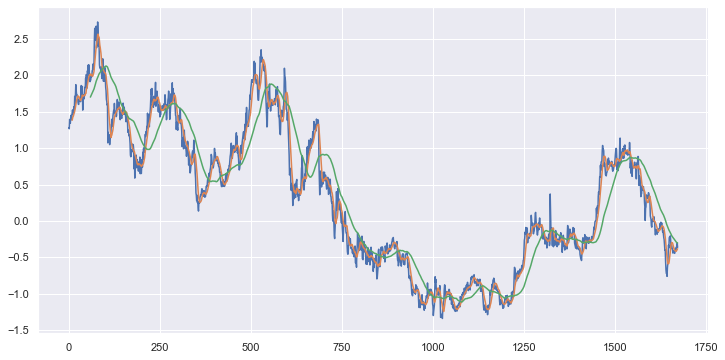

In [28]:
### Plotting ratio with MAs

plt.figure(figsize=(12, 6))

plt.plot(train.values)
plt.plot(MA10_ratio.values)
plt.plot(MA60_ratio.values)

# plt.plot(STD_ratio)
# plt.plot(STD_ratio_rev)

# plt.legend(['Ratio', '10d Ratio MA', '60d Ratio MA', 'STD', 'STD_rev'])
# #plt.ylabel('Ratio')
# plt.tight_layout()
# plt.show()

In [32]:
print(np.std(MA10_ratio))
print(np.std(MA60_ratio))

0.9745724377180721
0.945684704858896


In the below plot, z-score is calculated as the below equation suggest




* The short MA is subtracted by the long MA, and then divided by the long MA
* This is the appropriate way
* switching the positions of the short and long window will make the output the opposite

<!-- *** -->
$$
\begin{align}
ZSCORE\_10\_60 = \frac{MA\_10 - MA\_60}{STD\_60}
\end{align}
$$
<!-- *** -->

### Z-score of ratio - The right way

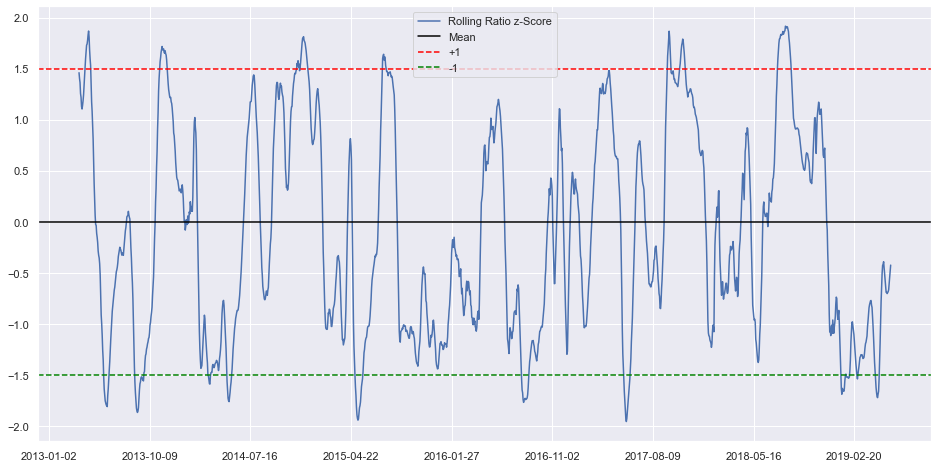

In [74]:
plt.figure(figsize=(16,8))
ZSCORE_10_60.plot()
# plt.xlim(ZSCORE_10_60.index[0], ZSCORE_10_60.index[-1])
plt.axhline(0, color='black')
plt.axhline(1.5, color='red', linestyle='--')
plt.axhline(-1.5, color='green', linestyle='--')
plt.legend(['Rolling Ratio z-Score', 'Mean', '+1', '-1'])
# plt.title(f'{S1.name} | {S2.name} -> Rolling z-score', loc='left', size='x-large')
plt.xlabel('')
plt.show()

In the below plot, z-score is calculated with the MAa above the division line in swapped positions. Observe that the below plot is the exact opposite of the above plot
<!-- *** -->
$$
\begin{align}
ZSCORE\_60\_10 = \frac{MA\_60 - MA\_10}{STD\_60}
\end{align}
$$
<!-- *** -->


### Assembling the model
Creating the following trading signals:
* Buy(1) whenever the z-score is below -1.5 -->  We expect the ratio to increase
* Sell(-1) whenever the z-score is above 1.5 -->  We expect the ratio to decrease

--> The buy and sell series are straight copies of the train series. The buy series focuses on negative part of the range (where the buy signals are to be generated) while the sell series focuses on the positive part of the range (where the sell signals are to be generated)

The instances of buy and sell, that are not outside the set limits for buy/sell-signals, are set to zero. When plotting all three series together (train, buy, sell), only the buy and sell signals will be visible for the buy and sell series


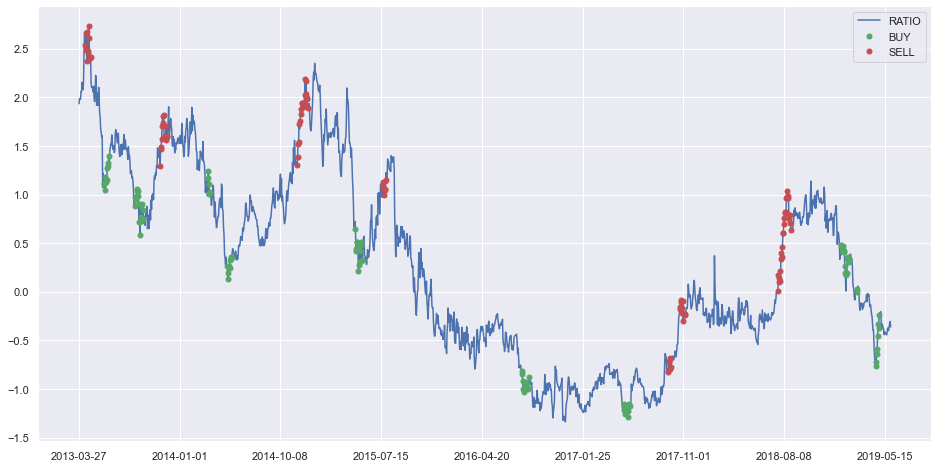

In [75]:
cutoff = 1.5

plt.figure(figsize=(16,8))

train[60:].plot(label='RATIO')

### making copies of "train", to put the trading signals in
buy = train.copy()
sell = train.copy()

### Neutral if zscore between -1.5 and 1.5
buy[ZSCORE_10_60 > -cutoff] = np.nan
sell[ZSCORE_10_60 < cutoff] = np.nan

buy[60:].plot(color='g', marker='o', markersize=5, linestyle='None', label = 'BUY')
sell[60:].plot(color='r', marker='o', markersize=5, linestyle='None', label = 'SELL')

plt.ylim(bottom=min(train) - 0.2)
plt.legend()
plt.xlabel(None)
# plt.tight_layout()
plt.show()

### Strategy visualized

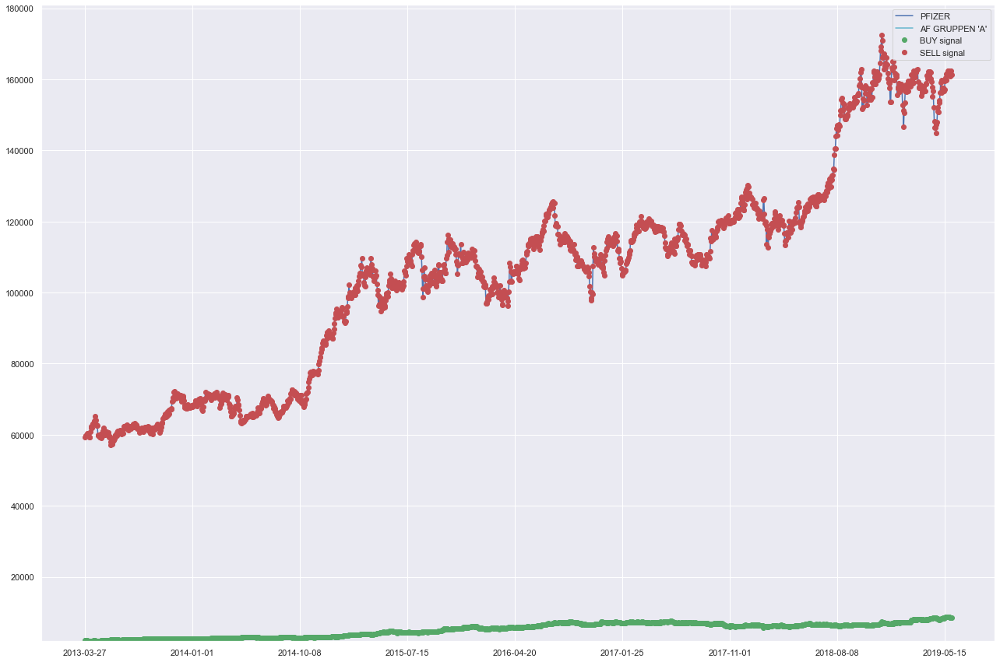

In [36]:
plt.figure(figsize=(18,12))

S1_train = S1[:split]
S2_train = S2[:split]

S1_train[60:].plot(color='b', label = S1_train.name)
S2_train[60:].plot(color='c', label = S2_train.name)

buyR = 0*S1_train.copy()
sellR = 0*S1_train.copy()

### When you buy the ratio --> Buy stock 1 and sell stock 2 simutanously

long_signals = buy[buy != np.nan].index

buyR[long_signals] = S1_train[long_signals]   # BUY S1_train
sellR[long_signals] = S2_train[long_signals]  # SELL S2_train

### When you sell the ratio --> Buy stock 2 and sell stock 1, simutanously

short_signals = sell[sell != np.nan].index

buyR[short_signals] = S2_train[short_signals]   # BUY S2_train
sellR[short_signals] = S1_train[short_signals]  # SELL S1_train

buyR[60:].plot(color='g', linestyle='None', marker='o', label = 'BUY signal')
sellR[60:].plot(color='r', linestyle='None', marker='o', label = 'SELL signal')

plt.legend()
plt.xlabel(None)
plt.ylim(bottom=min(min(S1_train), min(S2_train)) - 5)
plt.tight_layout()
plt.show()

### Original
NOTES:
* The **"money"** variable is the accumulated profits from the trading.
    * The "money" variable  also functions as a storehold for the money in the trading phase
    * Money decreases when buying (you spend money)
    * Money increases when selling (you get money)
* The for-loop in the **"trade"** function iterares over all the calculated z-scores, one z-score corresponding to one day in the trading phase 
    * When the z-score crosses above a defined distance (cutoff) &rarr; sell the ratio
    * When the z-score crosses below a defined distance (-cutoff) &rarr: sell the ratio
    * When the z-score reverts to the zero
        * This boundary can optionally be set to an absolute distance from zero. This will revert the trades more frequently,    as the z-score nok longer needs to reach zero
* The **"countS1**" and **"countS2"** variables counts the units of the two timeseries currently held
    * Negative number = n units of insrument sold (shorted)
    * Positive number = n units of insrument bought (long)
* **"Current_amount_S1/S2"** &rarr; The current amount of money sold / bought in the two stocks.
    * This amount should be equal for both stocks. The amount is reset every time when the positions are reversed.
* **pS1 / pS2** &rarr; Cumulative profits from the respective time series
    * The cumulative profits for each of the stocks should equal the total strategy profit
***
    

### Implementation of strategy
COMMENTS:
* Figure out the different parts of the for loop
* Decide how to determine the upper, lower and "clear-positions" boundaries
* Explore / determine the rolling windows (currently 60, 10)

* The order of the MAs is important! make sure the short moving average is "first"

### TRADE_1 - Basic framework

In [631]:
def TRADE_1(S1: pd.Series,
            S2: pd.Series,
            short_window:  int,  
            long_window:   int,   
            cutoff_outer:  float = 1.0,
            cutoff_inner:  float = 0.33,
            rolling_z:     bool  = True,
            print_actions: bool  = True) -> float:
    
    """
    function for performing the proposed trading-framework. The function returns
    the amount of money accumulated over the trading period
    
    """
    
    assert (short_window > 0) and (long_window > 0), \
    "Null / Negative widnow values " 
    
    
    ratios = S1/S2
    
    if rolling_z:
        
        ### Compute rolling mean and rolling standard deviation
    
        ma1 = ratios.rolling(window = short_window,
                             center = False).mean()
        
        ma2 = ratios.rolling(window = long_window,
                            center  = False).mean()
        
        std = ratios.rolling(window = long_window,
                            center  = False).std()
        
        zscore = (ma1 - ma2) / std
        
    else:
        ### Use standard z-score of the ratio
    
        zscore = (ratios - ratios.mean()) / ratios.std()
    
    ### Simulate trading: start with zero money and no positions
    
    money = 0
    
    count_S1 = 0  
    count_S2 = 0
    
    num_trades = 0
    num_trade_bulks = 0
    
    num_b = 0
    
    current_amount_S1 = 0
    current_amount_S2 = 0
    
    ### Cumulative profit
    
    pS1 = 0
    pS2 = 0
    
    state = [None] * (len(ratios))
    
    ### Dictionary of the amount set in a trade and the return
    
    return_dict_S1 = {}
    return_dict_S2 = {}
    
    return_dict = {}
    return_dict_formatted = {}
    
    for i in range(1, len(ratios)):

        ### Sell short if the z-score is > 1
        
        ### >>> LEGG INN NYE REGLER HER <<< ###
        
        #if zscore[i] < -1 and func(point) == 'Good Point':
        
        if zscore[i] > cutoff_outer:
            
            state[i] = 'Selling'
            
            # sell S1, buy S2
            money += S1[i] - S2[i] * ratios[i]
            
            count_S1 -= 1
            count_S2 += ratios[i]
            
            current_amount_S1 += S1[i]
            current_amount_S2 += S2[i] * ratios[i]
            
            if print_actions:
            
                print(f'Selling ratio \n money: {money:>22.2f} \n zscore: {zscore[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \n ') 

        ### Buy long if the z-score is < -1
        
        ### >>> LEGG INN NYE REGLER HER <<< ###
        
        elif zscore[i] < -cutoff_outer:
            
            state[i] = 'Buying'
            
            # Buy S1, Sell S2
            money -= S1[i] - S2[i] * ratios[i]
            count_S1 += 1
            count_S2 -= ratios[i]
            
            current_amount_S1 += S1[i]
            current_amount_S2 += S2[i] * ratios[i]
            
            if print_actions:

                print(f'Buying ratio: \n money: {money:>22.2f} \n zscore: {zscore[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n Num: {i} \n ') 
                
        ### Clear positions if the z-score between the absolute values of the distance from z-score
        elif abs(zscore[i]) < cutoff_inner or\
                ((zscore[i-1] > 0) and (zscore[i] < 0)) or\
                ((zscore[i-1] < 0) and (zscore[i] > 0)):
            
            state[i] = 'Reversing'
            
            prev_money = money
                        
            money += S1[i] * count_S1 + S2[i] * count_S2  # all positions are reversed -> multiplying with the count
            
            money_profit = S1[i] * count_S1 + S2[i] * count_S2
            amount_in_trade = (current_amount_S1 + current_amount_S2)
            
            profit = money_profit / amount_in_trade
            
            
            if amount_in_trade != 0:
                
                return_ = (money / prev_money) - 1
                
                return_dict[amount_in_trade] = profit
                return_dict_formatted[f'{amount_in_trade:_.0f}'] = f'{profit:.2%}'
                
#                 returns.append(money / prev_money)
            
            ### If S1 bought, and S2 Shorted
            if (count_S1 > 0.0) and (count_S2 < 0.0):
                
                market_value_S1 = S1[i] * count_S1   # count positive
                market_value_S2 = S2[i] * -count_S2  # count negative
            
                pS1 += market_value_S1 - current_amount_S1
                pS2 += current_amount_S2 - market_value_S2
                

                
            ### If S1 sold, and S2 bought 
            elif (count_S1 < 0.0) and (count_S2 > 0.0):
                
                market_value_S1 = S1[i] * -count_S1  # count negative
                market_value_S2 = S2[i] * count_S2   # count positive
                
                pS1 += current_amount_S1 - market_value_S1
                pS2 += market_value_S2 - current_amount_S2
            
            # Add one extra for the "reverison trade"
            if abs(count_S1) > 0:
                num_trades += (abs(count_S1) + 1)
            
            count_S1 = 0     # position zeroed out
            count_S2 = 0     # position zeroed out
            
            current_amount_S1 = 0
            current_amount_S2 = 0
            
            
            if print_actions:

                print(f'Exit positions \n money: {money:>22.2f} \n zscore: {zscore[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n profit S1: {pS1:.2f} \
                       \n profit S2: {pS2:.2f} \
                       \n S1: {S1[i]} \
                       \n S2: {S2[i]} \
                       \n {i} \
                       \n returns: {return_dict_formatted} \n')
                      
        else:
            state[i] = 'Neutral'
#             print("Neutral")
        
        if (state[i-1] == 'Neutral') & (state[i] in ['Buying', 'Selling']):
#             print('&&&&&&&&&&BREAK&&&&&&&&&&&')
            num_trade_bulks += 1
        
        ### Updatigng trading_dict
#         if (state[i] == 'Reversing') & 
     
    ### If the z-score start outside the bounds, add one initialized trade bulk
    if abs(zscore[1]) >= cutoff_outer:
        num_trade_bulks +=1
        
    
    return_list = [v * k for v, k in return_dict.items()]
    if len(return_list) != 0:
        strategy_profit = sum(return_list) / sum(return_dict.keys())
    else:
        strategy_profit = 0
                
    return strategy_profit, num_trades, num_trade_bulks, state, return_dict, return_dict_formatted


### TRADE_2 - Function with additional trading rules

In [659]:
def TRADE_2(S1: pd.Series,
            S2: pd.Series,
            short_window:  int,  
            long_window:   int,   
            cutoff_outer:  float = 1.0,
            cutoff_inner:  float = 0.33,
            rolling_z:     bool  = True,
            print_actions: bool  = False,
            print_weighted: bool = True) -> float:
    
    """
    function for performing the proposed trading-framework. The function returns
    the amount of money accumulated over the trading period
    
    """
    
    ### Norwegian equity factor correlations
    # <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
    
    if S2.name == "AF GRUPPEN 'A'":
        S2.name = 'AF GRUPPEN A'
    
    NO_corr_20  = factor_corr_20[S2.name]
    NO_corr_20.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_50  = factor_corr_50[S2.name]
    NO_corr_50.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_100 = factor_corr_100[S2.name]
    NO_corr_100.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_200 = factor_corr_200[S2.name]
    NO_corr_200.dropna(axis=1, how='any', inplace=True)
    
    assert (NO_corr_20.isnull().sum().sum()) == 0, "nul-values present in factors -> 20"
    assert (NO_corr_50.isnull().sum().sum()) == 0, "nul-values present in factors -> 50"
    assert (NO_corr_100.isnull().sum().sum()) == 0, "nul-values present in factors -> 100"
    assert (NO_corr_200.isnull().sum().sum()) == 0, "nul-values present in factors -> 200"
    
    assert (short_window > 0) and (long_window > 0), \
    "Null / Negative widnow values "
    
    # <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
    
    ### Splitting
    
    S1 = S1.reindex(NO_corr_20.index, axis='index')
    S2 = S2.reindex(NO_corr_20.index, axis='index')
    
    split = int(len(S1) * 0.70)
    test_part_split = len(S1) - split
    
    S1_train = S1.iloc[:split]
    S2_train = S2.iloc[:split]
    
    S1_test = S1.iloc[split:]
    S2_test = S2.iloc[split:]
    
    ratios_train = S1_train / S2_train
    ratios_test = S1_test / S2_test
    
#     print(f'{S1.index[0]=}')
#     print(f'{S1.shape=}')
#     print(f'{ratios_test.shape=}')
#     print(f'{NO_corr_20.shape=}')
#     print(f'{NO_corr_20.index[0]=}')
    
    # IMPORTANT -> scale the z-scores of the test set with the data from the train set.
    # The mean and std of the "entire" test set is not attainable when testing each day going forward.
    zscore = (ratios_test - ratios_train.mean()) / ratios_train.std()
    
    factors_test = NO_corr_20[split:]    # From the start of the test set and out ->

    ### Concatenating zscore and factors
    
    zscore_and_factors = pd.concat([zscore, factors_test], axis=1)
    zscore_and_factors.rename(columns={0: 'z-score'}, inplace=True)
#     print(f'{zscore_and_factors.index=}')
    
    assert zscore_and_factors.isnull().sum().sum() == 0, "nul-values present in concatenated test set"
        

    ### Assessing factor sensitivity
    ### Using data from the train period
    ### The mean factor correlation over the last 600 days will form the basis for comparison
    ### against more recent correlations (in the test set)
    ### ****************************************************************************************
    
    factor_senstivity = {}      # Dictionary: {factor name: sensitivity (LOW, MED, HIGH)}
    factor_low_corr_list = []   # List of all factor_names where sensitiity == LOW
    
    corr_look_back_days = 600
    
    last_date_train = pd.to_datetime(S1_train.index[-1])
    look_back_start = str((last_date_train) - timedelta(corr_look_back_days))[:-9]
    
    NO_eqt_name = S2.name       # the Norwegian equities are always stored in the second column of the pair-df

    factor_lookback_frame = factor_corr_50[NO_eqt_name][look_back_start:]
    
    assert factor_lookback_frame.isnull().sum().sum() == 0, "nul-values exist"

    for f in factor_lookback_frame.columns:
        if factor_lookback_frame.mean()[f] > 0.3:
            factor_senstivity[f] = 'HIGH'
        elif factor_lookback_frame.mean()[f] < 0.1:             # Historic mean treshold for a factor to be labeled "LOW"
            factor_senstivity[f] = 'LOW'    # May make this as an input parameter, to investigate changes in result
            factor_low_corr_list.append(f)
        else:
            factor_senstivity[f] = 'MED'
    
#     print(factor_senstivity)
            
    ### ****************************************************************************************

    
    ### Finding the starting point of the ratios. Correlations are calculated based on the given look-back
    ### Window, so the first ... days need to be skipped in order to calculated the initial correlations
    ### based on these days. This is all done regarding the TEST SET
    
    look_back_corr_check = 20
    first_date_test = pd.to_datetime(zscore_and_factors.index[0])
    start_date_test = str((first_date_test) + timedelta(look_back_corr_check))[:-9]
#     print(first_date_test,'--> ', start_date_test)
#     print(f'{S1_test.index[0]=}')
    
    zscore_and_factors = zscore_and_factors[start_date_test:]
    ZSCORE = zscore_and_factors['z-score']
    FACTORS = zscore_and_factors.iloc[:,1:]
#     print(f'{zscore_and_factors.index=}')
    
    
    ### Simulate trading: start with zero money and no positions
    
    start_capital = 100_000
    money = 100_000
    
    count_S1 = 0  
    count_S2 = 0
    
    num_trades = 0
    num_trade_bulks = 0

    current_amount_S1 = 0
    current_amount_S2 = 0
    
    ### Cumulative profit
    
    pS1 = 0
    pS2 = 0
    
    state = [None] * (len(ZSCORE))
    
    ### Dictionary of the amount set in a trade and the return
    
    return_dict_S1 = {}
    return_dict_S2 = {}
    
    return_dict = {}
    return_dict_formatted = {}
    
    ### Tracking the weight of the trade for each time step
    up_weighted_trades_list = []
    up_weighted_trades_dict = {2: 0, 2.2: 0, 3: 0}
    num_up_weighed_trades = 0
    
    S1_test = S1_test[start_date_test:]
    S2_test = S2_test[start_date_test:]
#     print(f'{S1_test.index[0]=}')
    
    for i in range(1, len(ZSCORE)):
        
#         print(f'{S1_test.index[i]}')

        ratio_ = S1_test[i] / S2_test[i]
        
        weight = 1
        
        current_factors = zscore_and_factors.iloc[i,:]
        assert current_factors.shape == (len(zscore_and_factors.columns), ), "wrong shape of factors-entry"
#         print(current_factors.shape)
#         print(len(zscore_and_factors.columns))
        
        ### NEW DECISION CHECKS
        
        #¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤
        
        for factor_name in factor_low_corr_list:
            
            if 0.60 <= current_factors[factor_name] < 0.70  :          ### BOUNDARY FOR "LOW-FACTOR" TO BE MARKED AS ""
                weight = 2
                if print_weighted:
                    
                    print(f'{i:<3} | {factor_name}: {current_factors[factor_name]:.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                
            elif 0.70 <= current_factors[factor_name] < 0.80 :
                weight = 2.2
                if print_weighted:
                    
                    print(f'{i:<3} | {factor_name}: {current_factors[factor_name]:>3.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                
            elif 0.80 <= current_factors[factor_name]:
                weight = 3
                if print_weighted:
                    
                    print(f'{i:<3} | {factor_name}: {current_factors[factor_name]:>3.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1

            
        if weight != 1:
            num_up_weighed_trades += 1
                
            
                
        #¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤
        
        ### Sell short if the z-score is > 1
        
        if ZSCORE[i] > cutoff_outer:
            num_trades +=1
            
#             for factor in facto
            
            state[i] = 'Selling'
            
            # sell S1, buy S2
            money += (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)    # Money neutral (0) before reversion of trades
            
            count_S1 -= weight
            count_S2 += weight * ratio_
            
            current_amount_S1 += S1_test[i] * weight
            current_amount_S2 += S2_test[i] * ratio_ * weight
            
            if print_actions:
            
                print(f'Selling ratio \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n weight: {weight} \n ') 

        ### Buy long if the z-score is < -1
        
        elif ZSCORE[i] < -cutoff_outer:
            num_trades +=1
            
            state[i] = 'Buying'
            
            # Buy S1, Sell S2
            money -= (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)
            count_S1 += weight
            count_S2 -= weight * ratio_
            
            current_amount_S1 += S1_test[i] * weight
            current_amount_S2 += S2_test[i] * ratio_ * weight
            
            if print_actions:

                print(f'Buying ratio: \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n Num: {i} \
                       \n Weight: {weight} \n ') 
                
        ### Clear positions if the z-score between the absolute values of the distance from z-score
        elif abs(ZSCORE[i]) < cutoff_inner or\
                ((ZSCORE[i-1] > 0) and (ZSCORE[i] < 0)) or\
                ((ZSCORE[i-1] < 0) and (ZSCORE[i] > 0)):
            
            state[i] = 'Reversing'
            
            prev_money = money
#             print(prev_money)
            
            money_profit = S1_test[i] * count_S1 + S2_test[i] * count_S2
#             print(money_profit)
                        
            money += money_profit  # all positions are reversed -> multiplying with the count

            amount_in_trade = (current_amount_S1 + current_amount_S2)
            
            profit = money_profit / amount_in_trade
            
            
            if amount_in_trade != 0:
                
                return_ = (money / prev_money) - 1
                
                return_dict[amount_in_trade] = profit
                return_dict_formatted[f'{amount_in_trade:_.0f}'] = f'{profit:.2%}'
                
#                 returns.append(money / prev_money)
            
            ### If S1 bought, and S2 Shorted
            if (count_S1 > 0.0) and (count_S2 < 0.0):
                
                market_value_S1 = S1_test[i] * count_S1   # count positive
                market_value_S2 = S2_test[i] * -count_S2  # count negative
            
                pS1 += market_value_S1 - current_amount_S1
                pS2 += current_amount_S2 - market_value_S2
                

                
            ### If S1 sold, and S2 bought 
            elif (count_S1 < 0.0) and (count_S2 > 0.0):
                
                market_value_S1 = S1_test[i] * -count_S1  # count negative
                market_value_S2 = S2_test[i] * count_S2   # count positive
                
                pS1 += current_amount_S1 - market_value_S1
                pS2 += market_value_S2 - current_amount_S2
            
            # Add one extra for the "reverison trade"
            if abs(count_S1) > 0:
                num_trades += (abs(count_S1) + 1)
            
            count_S1 = 0     # position zeroed out
            count_S2 = 0     # position zeroed out
            
            current_amount_S1 = 0
            current_amount_S2 = 0
            
            
            if print_actions:

                print(f'Exit positions \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n profit S1: {pS1:.2f} \
                       \n profit S2: {pS2:.2f} \
                       \n S1: {S1[i]} \
                       \n S2: {S2[i]} \
                       \n {i} \
                       \n returns: {return_dict_formatted} \n')
                      
        else:
            state[i] = 'Neutral'
#             print("Neutral")
        
        if (state[i-1] == 'Neutral') & (state[i] in ['Buying', 'Selling']):
#             print('&&&&&&&&&&BREAK&&&&&&&&&&&')
            num_trade_bulks += 1
        
        ### Updatigng trading_dict
#         if (state[i] == 'Reversing') & 
     
    ### If the z-score start outside the bounds, add one initialized trade bulk
    if abs(ZSCORE[1]) >= cutoff_outer:
        num_trade_bulks +=1
    
    ### Checking for the possibility for NO trades
    return_list = [v * k for v, k in return_dict.items()]
    
    if len(return_list) == 0:
        strategy_profit_trade_avg = 0
    else:
        strategy_profit_trade_avg = sum(return_list) / sum(return_dict.keys())
    
    
    strategy_profit_money = money - start_capital
    strategy_profit_of_start_cap = (money / start_capital) - 1
                
    return strategy_profit_money, strategy_profit_of_start_cap, strategy_profit_trade_avg, num_trades, num_trade_bulks, state,\
           return_dict, return_dict_formatted,\
           factor_senstivity, factor_low_corr_list, up_weighted_trades_list, up_weighted_trades_dict,\
           num_up_weighed_trades

### TRADE_3 - Function with additional trading rules

In [1180]:
def TRADE_3(S1: pd.Series,
            S2: pd.Series,
            short_window:  int,  
            long_window:   int,   
            cutoff_outer:  float = 1.0,
            cutoff_amp:    float = 1.5,        # multiplier of cutoff_outer, signalling additional BUY/SELL
            extra_order_mlut: float = 2.0,     # float to be multiplied in "amplified" order
            cutoff_inner:  float = 0.33,
            rolling_z:     bool  = True,
            print_actions: bool  = False,
            print_weighted: bool = True) -> float:
    
    """
    function for performing the proposed trading-framework. The function returns
    the amount of money accumulated over the trading period
    
    """
    
    CUTOFF_AMP = cutoff_outer*cutoff_amp
    
    ### Norwegian equity factor correlations
    # <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
    
    if S2.name == "AF GRUPPEN 'A'":
        S2.name = 'AF GRUPPEN A'
    
    NO_corr_20  = factor_corr_20[S2.name]
    NO_corr_20.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_50  = factor_corr_50[S2.name]
    NO_corr_50.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_100 = factor_corr_100[S2.name]
    NO_corr_100.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_200 = factor_corr_200[S2.name]
    NO_corr_200.dropna(axis=1, how='any', inplace=True)
    
    assert (NO_corr_20.isnull().sum().sum()) == 0, "nul-values present in factors -> 20"
    assert (NO_corr_50.isnull().sum().sum()) == 0, "nul-values present in factors -> 50"
    assert (NO_corr_100.isnull().sum().sum()) == 0, "nul-values present in factors -> 100"
    assert (NO_corr_200.isnull().sum().sum()) == 0, "nul-values present in factors -> 200"
    
    assert (short_window > 0) and (long_window > 0), \
    "Null / Negative widnow values "
    
    # <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
    
    ### Splitting
    
    S1 = S1.reindex(NO_corr_20.index, axis='index')
    S2 = S2.reindex(NO_corr_20.index, axis='index')
    
    split = int(len(S1) * 0.70)
    test_part_split = len(S1) - split
    
    S1_train = S1.iloc[:split]
    S2_train = S2.iloc[:split]
    
    S1_test = S1.iloc[split:]
    S2_test = S2.iloc[split:]
    
    ratios_train = S1_train / S2_train
    ratios_test = S1_test / S2_test
    
    
    # IMPORTANT -> scale the z-scores of the test set with the data from the train set.
    # The mean and std of the "entire" test set is not attainable when testing each day going forward.
    zscore = (ratios_test - ratios_train.mean()) / ratios_train.std()
    
    factors_test = NO_corr_20[split:]    # From the start of the test set and out ->

    ### Concatenating zscore and factors
    
    zscore_and_factors = pd.concat([zscore, factors_test], axis=1)
    zscore_and_factors.rename(columns={0: 'z-score'}, inplace=True)
    
    assert zscore_and_factors.isnull().sum().sum() == 0, "nul-values present in concatenated test set"
        

    ### Assessing factor sensitivity
    ### Using data from the train period
    ### The mean factor correlation over the last 600 days will form the basis for comparison
    ### against more recent correlations (in the test set)
    ### ****************************************************************************************
    
    factor_senstivity = {}      # Dictionary: {factor name: sensitivity (LOW, MED, HIGH)}
    factor_low_corr_list = []   # List of all factor_names where sensitiity == LOW
    
    corr_look_back_days = 600
    
    last_date_train = pd.to_datetime(S1_train.index[-1])
    look_back_start = str((last_date_train) - timedelta(corr_look_back_days))[:-9]
    
    NO_eqt_name = S2.name       # the Norwegian equities are always stored in the second column of the pair-df

    factor_lookback_frame = factor_corr_50[NO_eqt_name][look_back_start:]
    
    assert factor_lookback_frame.isnull().sum().sum() == 0, "nul-values exist"

    for f in factor_lookback_frame.columns:
        if factor_lookback_frame.mean()[f] > 0.3:
            factor_senstivity[f] = 'HIGH'
        elif factor_lookback_frame.mean()[f] < 0.1:             # Historic mean treshold for a factor to be labeled "LOW"
            factor_senstivity[f] = 'LOW'    # May make this as an input parameter, to investigate changes in result
            factor_low_corr_list.append(f)
        else:
            factor_senstivity[f] = 'MED'
            
    ### ****************************************************************************************

    
    ### Finding the starting point of the ratios. Correlations are calculated based on the given look-back
    ### Window, so the first ... days need to be skipped in order to calculated the initial correlations
    ### based on these days. This is all done regarding the TEST SET
    
    look_back_corr_check = 20
    first_date_test = pd.to_datetime(zscore_and_factors.index[0])
    start_date_test = str((first_date_test) + timedelta(look_back_corr_check))[:-9]
    
    zscore_and_factors = zscore_and_factors[start_date_test:]
    ZSCORE = zscore_and_factors['z-score']
    FACTORS = zscore_and_factors.iloc[:,1:]
    
    ### Simulate trading: start with zero money and no positions
    
    start_capital = 1_000_000
    money = 1_000_000
    
    count_S1 = 0  
    count_S2 = 0
    
    num_trades = 0
    num_trade_bulks = 0

    current_amount_S1 = 0
    current_amount_S2 = 0
    
    ### Cumulative profit
    
    pS1 = 0
    pS2 = 0
    
    state = [None] * (len(ZSCORE))
    STATE_DICT = {}
    
    ### Dictionary of the amount set in a trade and the return
    
    return_dict_S1 = {}
    return_dict_S2 = {}
    
    return_dict = {}
    return_dict_formatted = {}
    
    ### Tracking the weight of the trade for each time step
    weight_list = []
    up_weighted_trades_list = []
    up_weighted_trades_dict = {2: 0, 2.2: 0, 3: 0}
    num_up_weighed_trades = 0
    
    corr_strength = {}
    
    S1_test = S1_test[start_date_test:]
    S2_test = S2_test[start_date_test:]
    
    has_reversed = [True if -cutoff_inner < ZSCORE[0] < cutoff_inner else False]
    
    Good_days = {}

    for i in range(1, len(ZSCORE)):
        
        CURRENT_DAY = zscore_and_factors.index[i]

        ratio_ = S1_test[i] / S2_test[i]
        
        weight = 1
        
        current_factors = zscore_and_factors.iloc[i,:]
        assert current_factors.shape == (len(zscore_and_factors.columns), ), "wrong shape of factors-entry"
        
        ### NEW DECISION CHECKS
        
        #¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤
        
        num_correlated_factors = 0
        
        for factor_name in factor_low_corr_list:
            
            if 0.60 <= current_factors[factor_name] < 0.70  :          ### BOUNDARY FOR "LOW-FACTOR" TO BE MARKED AS ""
                weight = 2
                if print_weighted:
                    
                    print(f'{CURRENT_DAY:<3} | {factor_name}: {current_factors[factor_name]:.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                num_correlated_factors +=1
                corr_strength[CURRENT_DAY] = 0.60
                
            elif 0.70 <= current_factors[factor_name] < 0.80 :
                weight = 2.2
                if print_weighted:
                    
                    print(f'{CURRENT_DAY:<3} | {factor_name}: {current_factors[factor_name]:>3.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                num_correlated_factors +=1
                corr_strength[CURRENT_DAY] = 0.70
                
            elif 0.80 <= current_factors[factor_name]:
                weight = 3
                if print_weighted:
                    
                    print(f'{CURRENT_DAY:<3} | {factor_name}: {current_factors[factor_name]:>3.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                num_correlated_factors +=1
                corr_strength[CURRENT_DAY] = 0.80
            
        if num_correlated_factors == 0:
            corr_strength[CURRENT_DAY] = 'No detected correlation'
        elif num_correlated_factors >=1:
            Good_days[CURRENT_DAY] = num_correlated_factors

        if weight != 1:
            num_up_weighed_trades += 1
                
            
                
        #¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤
        
        ### Sell short if the z-score is > 1
        # ------------------------------------------------------------------------------------------------
        ### 1 -> "Normal order"
        if (ZSCORE[i] >= cutoff_outer) & (ZSCORE[i-1] < cutoff_outer):
            
            num_trades +=1
            
            state[i] = 'Selling'
            STATE_DICT[CURRENT_DAY] = 'Selling'
            
#             if weight * S1_test[i] < AMOUNT_AVAILABE:
#                 pass 
            
            # sell S1, buy S2
            money += (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)    # Money neutral (0) before reversion of trades
            
#             AMOUNT_AVAILABE -= weight * S1_test[i]
            
            count_S1 -= weight
            count_S2 += weight * ratio_
            
            current_amount_S1 += S1_test[i] * weight
            current_amount_S2 += S2_test[i] * ratio_ * weight
            
            if print_actions:
            
                print(f'Selling ratio \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n weight: {weight} \
                       \n Date: {zscore_and_factors.index[i]}\n ')
                
            has_reversed = False
        
        #### 2 -> Amplified order      
        elif (ZSCORE[i] >= CUTOFF_AMP) & (ZSCORE[i-1] < CUTOFF_AMP):
            
            weight = weight * extra_order_mlut
            
            num_trades +=1
            
            state[i] = 'Selling Amplified'
            STATE_DICT[CURRENT_DAY] = 'Selling Amplified'
            
            # sell S1, buy S2
            money += (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)    # Money neutral (0) before reversion of trades
            
            count_S1 -= weight
            count_S2 += weight * ratio_
            
            current_amount_S1 += S1_test[i] * weight
            current_amount_S2 += S2_test[i] * ratio_ * weight
            
            if print_actions:
            
                print(f'Selling ratio \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n weight: {weight} \
                       \n Date: {zscore_and_factors.index[i]}\n ')
            has_reversed = False
                
        # ------------------------------------------------------------------------------------------------

        ### Buy long if the z-score is < -1
        # ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
        # 1 - "Normal order"
        elif (ZSCORE[i] < -cutoff_outer) & (ZSCORE[i-1] > -cutoff_outer):
            
            num_trades +=1
            
            state[i] = 'Buying'
            STATE_DICT[CURRENT_DAY] = 'Buying'
            
            # Buy S1, Sell S2
            money -= (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)
            count_S1 += weight
            count_S2 -= weight * ratio_
            
            current_amount_S1 += S1_test[i] * weight
            current_amount_S2 += S2_test[i] * ratio_ * weight
            
            if print_actions:

                print(f'Buying ratio: \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n Num: {i} \
                       \n Weight: {weight} \
                       \n Date: {zscore_and_factors.index[i]}\n ')
                
            has_reversed = False
                
        # 2 - Amplified order
        elif (ZSCORE[i] < -CUTOFF_AMP) & (ZSCORE[i-1] > -CUTOFF_AMP):
            
            weight = weight * extra_order_mlut
            
            num_trades +=1
            
            state[i] = 'Buying Amplified'
            STATE_DICT[CURRENT_DAY] = 'Buying Amplified'
            
            # Buy S1, Sell S2
            money -= (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)
            count_S1 += weight
            count_S2 -= weight * ratio_
            
            current_amount_S1 += S1_test[i] * weight
            current_amount_S2 += S2_test[i] * ratio_ * weight
            
            if print_actions:

                print(f'Buying ratio: \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n Num: {i} \
                       \n Weight: {weight} \
                       \n Date: {zscore_and_factors.index[i]}\n ')
                
            has_reversed = False
        
        
                
        ### Clear positions if the z-score between the absolute values of the distance from z-score
        elif (((abs(ZSCORE[i]) < cutoff_inner) and (abs(ZSCORE[i-1]) > cutoff_inner)) or\
                ((ZSCORE[i-1] > 0) and (ZSCORE[i] < 0)) or\
                ((ZSCORE[i-1] < 0) and (ZSCORE[i] > 0))) and\
                has_reversed == False:
            
            state[i] = 'Reversing'
            STATE_DICT[CURRENT_DAY] = 'Reversing'
            
            prev_money = money

            money_profit = S1_test[i] * count_S1 + S2_test[i] * count_S2

                        
            money += money_profit  # all positions are reversed -> multiplying with the count

            amount_in_trade = (current_amount_S1 + current_amount_S2)
            
            profit = money_profit / amount_in_trade
            
            has_reversed = True
            
            
            if amount_in_trade != 0:
                
                return_ = (money / prev_money) - 1
                
                return_dict[amount_in_trade] = profit
                return_dict_formatted[f'{amount_in_trade:_.0f}'] = f'{profit:.2%}'
            
            ### If S1 bought, and S2 Shorted
            if (count_S1 > 0.0) and (count_S2 < 0.0):
                
                market_value_S1 = S1_test[i] * count_S1   # count positive
                market_value_S2 = S2_test[i] * -count_S2  # count negative
            
                pS1 += market_value_S1 - current_amount_S1
                pS2 += current_amount_S2 - market_value_S2
                

                
            ### If S1 sold, and S2 bought 
            elif (count_S1 < 0.0) and (count_S2 > 0.0):
                
                market_value_S1 = S1_test[i] * -count_S1  # count negative
                market_value_S2 = S2_test[i] * count_S2   # count positive
                
                pS1 += current_amount_S1 - market_value_S1
                pS2 += market_value_S2 - current_amount_S2
            
            # Add one extra for the "reverison trade"
            if abs(count_S1) > 0:
                num_trades += (abs(count_S1) + 1)
            
            count_S1 = 0     # position zeroed out
            count_S2 = 0     # position zeroed out
            
            current_amount_S1 = 0
            current_amount_S2 = 0
            
            
            if print_actions:

                print(f'Exit positions \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n profit S1: {pS1:.2f} \
                       \n profit S2: {pS2:.2f} \
                       \n S1: {S1[i]} \
                       \n S2: {S2[i]} \
                       \n {i} \
                       \n returns: {return_dict_formatted} \
                       \n Date: {zscore_and_factors.index[i]}\n')
                      
        else:
            state[i] = 'Neutral'
            STATE_DICT[CURRENT_DAY] = 'Neutral'

        
        if (state[i-1] == 'Neutral') & (state[i] in ['Buying', 'Selling']):
            num_trade_bulks += 1
        
        weight_list.append(weight)
        

     
    ### If the z-score start outside the bounds, add one initialized trade bulk
    if abs(ZSCORE[1]) >= cutoff_outer:
        num_trade_bulks +=1
    
    ### Checking for the possibility for NO trades
    return_list = [v * k for v, k in return_dict.items()]
    
    if len(return_list) == 0:
        strategy_profit_trade_avg = 0
    else:
        strategy_profit_trade_avg = sum(return_list) / sum(return_dict.keys())
    
    
    strategy_profit_money = money - start_capital
    strategy_profit_of_start_cap = (money / start_capital) - 1
    
    
    ### Assessing factor sensitivites

    upweighted_factors = pd.Series(strategy_weights_list)
    top_2_factors = upweighted_factors.value_counts().index[:2]
                
    return strategy_profit_money, strategy_profit_of_start_cap, strategy_profit_trade_avg, num_trades, num_trade_bulks,\
           STATE_DICT, return_dict, return_dict_formatted,\
           factor_senstivity, factor_low_corr_list, up_weighted_trades_list, up_weighted_trades_dict,\
           num_up_weighed_trades, weight_list, corr_strength,\
           start_date_test, top_2_factors, Good_days

### TRADE_4

In [1246]:
def TRADE_4(S1: pd.Series,
            S2: pd.Series,
            short_window:  int,  
            long_window:   int,
            start_capital: int = 1_000_000,
            cutoff_outer:  float = 1.0,
            cutoff_amp:    float = 1.5,        # multiplier of cutoff_outer, signalling additional BUY/SELL
            extra_order_mlut: float = 2.0,     # float to be multiplied in "amplified" order
            cutoff_inner:  float = 0.33,
            rolling_z:     bool  = True,
            print_actions: bool  = False,
            print_weighted: bool = True) -> float:
    
    """
    function for performing the proposed trading-framework. The function returns
    the amount of money accumulated over the trading period
    
    """
    
    CUTOFF_AMP = cutoff_outer*cutoff_amp
    
    ### Norwegian equity factor correlations
    # <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
    
    if S2.name == "AF GRUPPEN 'A'":
        S2.name = 'AF GRUPPEN A'
    
    NO_corr_20  = factor_corr_20[S2.name]
    NO_corr_20.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_50  = factor_corr_50[S2.name]
    NO_corr_50.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_100 = factor_corr_100[S2.name]
    NO_corr_100.dropna(axis=1, how='any', inplace=True)
    
    NO_corr_200 = factor_corr_200[S2.name]
    NO_corr_200.dropna(axis=1, how='any', inplace=True)
    
    assert (NO_corr_20.isnull().sum().sum()) == 0, "nul-values present in factors -> 20"
    assert (NO_corr_50.isnull().sum().sum()) == 0, "nul-values present in factors -> 50"
    assert (NO_corr_100.isnull().sum().sum()) == 0, "nul-values present in factors -> 100"
    assert (NO_corr_200.isnull().sum().sum()) == 0, "nul-values present in factors -> 200"
    
    assert (short_window > 0) and (long_window > 0), \
    "Null / Negative widnow values "
    
    # <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
    
    ### Splitting
    
    S1 = S1.reindex(NO_corr_20.index, axis='index')
    S2 = S2.reindex(NO_corr_20.index, axis='index')
    
    split = int(len(S1) * 0.70)
    test_part_split = len(S1) - split
    
    S1_train = S1.iloc[:split]
    S2_train = S2.iloc[:split]
    
    S1_test = S1.iloc[split:]
    S2_test = S2.iloc[split:]
    
    ratios_train = S1_train / S2_train
    ratios_test = S1_test / S2_test
    
    
    # IMPORTANT -> scale the z-scores of the test set with the data from the train set.
    # The mean and std of the "entire" test set is not attainable when testing each day going forward.
    zscore = (ratios_test - ratios_train.mean()) / ratios_train.std()
    
    factors_test = NO_corr_20[split:]    # From the start of the test set and out ->

    ### Concatenating zscore and factors
    
    zscore_and_factors = pd.concat([zscore, factors_test], axis=1)
    zscore_and_factors.rename(columns={0: 'z-score'}, inplace=True)
    
    assert zscore_and_factors.isnull().sum().sum() == 0, "nul-values present in concatenated test set"
        

    ### Assessing factor sensitivity
    ### Using data from the train period
    ### The mean factor correlation over the last 600 days will form the basis for comparison
    ### against more recent correlations (in the test set)
    ### ****************************************************************************************
    
    factor_senstivity = {}      # Dictionary: {factor name: sensitivity (LOW, MED, HIGH)}
    factor_low_corr_list = []   # List of all factor_names where sensitiity == LOW
    
    corr_look_back_days = 600
    
    last_date_train = pd.to_datetime(S1_train.index[-1])
    look_back_start = str((last_date_train) - timedelta(corr_look_back_days))[:-9]
    
    NO_eqt_name = S2.name       # the Norwegian equities are always stored in the second column of the pair-df

    factor_lookback_frame = factor_corr_50[NO_eqt_name][look_back_start:]
    
    assert factor_lookback_frame.isnull().sum().sum() == 0, "nul-values exist"

    for f in factor_lookback_frame.columns:
        if factor_lookback_frame.mean()[f] > 0.3:
            factor_senstivity[f] = 'HIGH'
        elif factor_lookback_frame.mean()[f] < 0.1:             # Historic mean treshold for a factor to be labeled "LOW"
            factor_senstivity[f] = 'LOW'    # May make this as an input parameter, to investigate changes in result
            factor_low_corr_list.append(f)
        else:
            factor_senstivity[f] = 'MED'
            
    ### ****************************************************************************************

    
    ### Finding the starting point of the ratios. Correlations are calculated based on the given look-back
    ### Window, so the first ... days need to be skipped in order to calculated the initial correlations
    ### based on these days. This is all done regarding the TEST SET
    
    look_back_corr_check = 20
    first_date_test = pd.to_datetime(zscore_and_factors.index[0])
    start_date_test = str((first_date_test) + timedelta(look_back_corr_check))[:-9]
    
    zscore_and_factors = zscore_and_factors[start_date_test:]
    ZSCORE = zscore_and_factors['z-score']
    FACTORS = zscore_and_factors.iloc[:,1:]
    
    ### Simulate trading: start with zero money and no positions
    
    AMOUNT_AVAILABE = start_capital
    money = start_capital
    
    count_S1 = 0  
    count_S2 = 0
    
    num_trades = 0
    num_trade_bulks = 0

    current_amount_S1 = 0
    current_amount_S2 = 0
    
    ### Cumulative profit
    
    pS1 = 0
    pS2 = 0
    
    state = [None] * (len(ZSCORE))
    STATE_DICT = {}
    
    ### Dictionary of the amount set in a trade and the return
    
    return_dict_S1 = {}
    return_dict_S2 = {}
    
    return_dict = {}
    return_dict_formatted = {}
    
    ### Tracking the weight of the trade for each time step
    weight_list = []
    up_weighted_trades_list = []
    up_weighted_trades_dict = {2: 0, 2.2: 0, 3: 0}
    num_up_weighed_trades = 0
    
    corr_strength = {}
    
    S1_test = S1_test[start_date_test:]
    S2_test = S2_test[start_date_test:]
    
    has_reversed = [True if -cutoff_inner < ZSCORE[0] < cutoff_inner else False]
    
    Good_days = {}

    for i in range(1, len(ZSCORE)):
        
        CURRENT_DAY = zscore_and_factors.index[i]

        ratio_ = S1_test[i] / S2_test[i]
        
        weight = 1
        
        current_factors = zscore_and_factors.iloc[i,:]
        assert current_factors.shape == (len(zscore_and_factors.columns), ), "wrong shape of factors-entry"
        
        ### NEW DECISION CHECKS
        
        #¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤
        
        num_correlated_factors = 0
        
        for factor_name in factor_low_corr_list:
            
            if 0.60 <= current_factors[factor_name] < 0.70  :          ### BOUNDARY FOR "LOW-FACTOR" TO BE MARKED AS ""
                weight = 2
                if print_weighted:
                    
                    print(f'{CURRENT_DAY:<3} | {factor_name}: {current_factors[factor_name]:.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                num_correlated_factors +=1
                corr_strength[CURRENT_DAY] = 0.60
                
            elif 0.70 <= current_factors[factor_name] < 0.80 :
                weight = 2.2
                if print_weighted:
                    
                    print(f'{CURRENT_DAY:<3} | {factor_name}: {current_factors[factor_name]:>3.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                num_correlated_factors +=1
                corr_strength[CURRENT_DAY] = 0.70
                
            elif 0.80 <= current_factors[factor_name]:
                weight = 3
                if print_weighted:
                    
                    print(f'{CURRENT_DAY:<3} | {factor_name}: {current_factors[factor_name]:>3.2f} -> {weight}')
                    
                up_weighted_trades_list.append(factor_name)
                up_weighted_trades_dict[weight] +=1
                num_correlated_factors +=1
                corr_strength[CURRENT_DAY] = 0.80
            
        if num_correlated_factors == 0:
            corr_strength[CURRENT_DAY] = 'No detected correlation'
        elif num_correlated_factors >=1:
            Good_days[CURRENT_DAY] = num_correlated_factors

        if weight != 1:
            num_up_weighed_trades += 1
            
        weight_list.append(weight)
                
            
                
        #¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤
        
        ### Sell short if the z-score is > 1
        # ------------------------------------------------------------------------------------------------
        ### 1 -> "Normal order"
        if (ZSCORE[i] >= cutoff_outer) & (ZSCORE[i-1] < cutoff_outer):
            
            if (weight * S1_test[i]) < AMOUNT_AVAILABE:

                num_trades +=1
            
                state[i] = 'Selling'
                STATE_DICT[CURRENT_DAY] = 'Selling'
                
                AMOUNT_AVAILABE -= weight * S1_test[i]
                 
                # sell S1, buy S2
                money += (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)    # Money neutral (0) before reversion of trades

                count_S1 -= weight
                count_S2 += weight * ratio_

                current_amount_S1 += S1_test[i] * weight
                current_amount_S2 += S2_test[i] * ratio_ * weight

                if print_actions:

                    print(f'Selling ratio \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                           \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                           \n current_amount_S1: {current_amount_S1:>10.2f} \
                           \n current_amount_S2: {current_amount_S2:>10.2f} \
                           \n weight: {weight} \
                           \n Date: {zscore_and_factors.index[i]}\n ')

                has_reversed = False
            else:
                state[i] = 'Selling (not performed)'
                STATE_DICT[CURRENT_DAY] = 'Selling (not performed)'
        
        #### 2 -> Amplified order      
        elif (ZSCORE[i] >= CUTOFF_AMP) & (ZSCORE[i-1] < CUTOFF_AMP):
            
            if (weight * S1_test[i]) < AMOUNT_AVAILABE:
            
                weight = weight * extra_order_mlut

                num_trades +=1

                state[i] = 'Selling Amplified'
                STATE_DICT[CURRENT_DAY] = 'Selling Amplified'
                
                AMOUNT_AVAILABE -= weight * S1_test[i]

                # sell S1, buy S2
                money += (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)    # Money neutral (0) before reversion of trades

                count_S1 -= weight
                count_S2 += weight * ratio_

                current_amount_S1 += S1_test[i] * weight
                current_amount_S2 += S2_test[i] * ratio_ * weight

                if print_actions:

                    print(f'Selling ratio \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                           \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                           \n current_amount_S1: {current_amount_S1:>10.2f} \
                           \n current_amount_S2: {current_amount_S2:>10.2f} \
                           \n weight: {weight} \
                           \n Date: {zscore_and_factors.index[i]}\n ')
                has_reversed = False
            
            else:
                state[i] = 'Selling Amplified (not performed)'
                STATE_DICT[CURRENT_DAY] = 'Selling Amplified (not performed)'
                
        # ------------------------------------------------------------------------------------------------

        ### Buy long if the z-score is < -1
        # ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
        # 1 - "Normal order"
        elif (ZSCORE[i] < -cutoff_outer) & (ZSCORE[i-1] > -cutoff_outer):
            
            if (weight * S1_test[i]) < AMOUNT_AVAILABE:
            
                num_trades +=1

                state[i] = 'Buying'
                STATE_DICT[CURRENT_DAY] = 'Buying'
                
                AMOUNT_AVAILABE -= weight * S1_test[i]

                # Buy S1, Sell S2
                money -= (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)
                count_S1 += weight
                count_S2 -= weight * ratio_

                current_amount_S1 += S1_test[i] * weight
                current_amount_S2 += S2_test[i] * ratio_ * weight

                if print_actions:

                    print(f'Buying ratio: \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                           \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                           \n current_amount_S1: {current_amount_S1:>10.2f} \
                           \n current_amount_S2: {current_amount_S2:>10.2f} \
                           \n Num: {i} \
                           \n Weight: {weight} \
                           \n Date: {zscore_and_factors.index[i]}\n ')

                has_reversed = False
                
            else:
                state[i] = 'Buying (not performed)'
                STATE_DICT[CURRENT_DAY] = 'Buying (not performed)'
                
        # 2 - Amplified order
        elif (ZSCORE[i] < -CUTOFF_AMP) & (ZSCORE[i-1] > -CUTOFF_AMP):
            
            if (weight * S1_test[i]) < AMOUNT_AVAILABE:
            
                weight = weight * extra_order_mlut

                num_trades +=1

                state[i] = 'Buying Amplified'
                STATE_DICT[CURRENT_DAY] = 'Buying Amplified'
                
                AMOUNT_AVAILABE -= weight * S1_test[i]

                # Buy S1, Sell S2
                money -= (weight * S1_test[i]) - (weight * S2_test[i] * ratio_)
                count_S1 += weight
                count_S2 -= weight * ratio_

                current_amount_S1 += S1_test[i] * weight
                current_amount_S2 += S2_test[i] * ratio_ * weight

                if print_actions:

                    print(f'Buying ratio: \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                           \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                           \n current_amount_S1: {current_amount_S1:>10.2f} \
                           \n current_amount_S2: {current_amount_S2:>10.2f} \
                           \n Num: {i} \
                           \n Weight: {weight} \
                           \n Date: {zscore_and_factors.index[i]}\n ')

                has_reversed = False
                
            else:
                state[i] = 'Buying Amplified (not performed)'
                STATE_DICT[CURRENT_DAY] = 'Buying Amplified (not performed)'
        
        
                
        ### Clear positions if the z-score between the absolute values of the distance from z-score
        elif (((abs(ZSCORE[i]) < cutoff_inner) and (abs(ZSCORE[i-1]) > cutoff_inner)) or\
                ((ZSCORE[i-1] > 0) and (ZSCORE[i] < 0)) or\
                ((ZSCORE[i-1] < 0) and (ZSCORE[i] > 0))) and\
                has_reversed == False:
            
            state[i] = 'Reversing'
            STATE_DICT[CURRENT_DAY] = 'Reversing'
            
            prev_money = money

            money_profit = S1_test[i] * count_S1 + S2_test[i] * count_S2

                        
            money += money_profit  # all positions are reversed -> multiplying with the count
            
            AMOUNT_AVAILABE = money

            amount_in_trade = (current_amount_S1 + current_amount_S2)
            
            profit = money_profit / amount_in_trade
            
            has_reversed = True
            
            
            if amount_in_trade != 0:
                
                return_ = (money / prev_money) - 1
                
                return_dict[amount_in_trade] = profit
                return_dict_formatted[f'{amount_in_trade:_.0f}'] = f'{profit:.2%}'
            
            ### If S1 bought, and S2 Shorted
            if (count_S1 > 0.0) and (count_S2 < 0.0):
                
                market_value_S1 = S1_test[i] * count_S1   # count positive
                market_value_S2 = S2_test[i] * -count_S2  # count negative
            
                pS1 += market_value_S1 - current_amount_S1
                pS2 += current_amount_S2 - market_value_S2
                

                
            ### If S1 sold, and S2 bought 
            elif (count_S1 < 0.0) and (count_S2 > 0.0):
                
                market_value_S1 = S1_test[i] * -count_S1  # count negative
                market_value_S2 = S2_test[i] * count_S2   # count positive
                
                pS1 += current_amount_S1 - market_value_S1
                pS2 += market_value_S2 - current_amount_S2
            
            # Add one extra for the "reverison trade"
            if abs(count_S1) > 0:
                num_trades += (abs(count_S1) + 1)
            
            count_S1 = 0     # position zeroed out
            count_S2 = 0     # position zeroed out
            
            current_amount_S1 = 0
            current_amount_S2 = 0
            
            
            if print_actions:

                print(f'Exit positions \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n profit S1: {pS1:.2f} \
                       \n profit S2: {pS2:.2f} \
                       \n S1: {S1[i]} \
                       \n S2: {S2[i]} \
                       \n {i} \
                       \n returns: {return_dict_formatted} \
                       \n Date: {zscore_and_factors.index[i]}\n')
                      
        else:
            state[i] = 'Neutral'
            STATE_DICT[CURRENT_DAY] = 'Neutral'

        
        if (state[i-1] == 'Neutral') & (state[i] in ['Buying', 'Selling']):
            num_trade_bulks += 1
            
    ### CLOSING OUSTANDING TRADES -> index: -1
    
    if count_S1 != 0:
            
            prev_money = money

            money_profit = S1_test[-1] * count_S1 + S2_test[-1] * count_S2
            money += money_profit  # all positions are reversed -> multiplying with the count
            
            AMOUNT_AVAILABE = money

            amount_in_trade = (current_amount_S1 + current_amount_S2)
            
            profit = money_profit / amount_in_trade
            
            has_reversed = True
            
            
            if amount_in_trade != 0:
                
                return_ = (money / prev_money) - 1
                
                return_dict[amount_in_trade] = profit
                return_dict_formatted[f'{amount_in_trade:_.0f}'] = f'{profit:.2%}'
            
            ### If S1 bought, and S2 Shorted
            if (count_S1 > 0.0) and (count_S2 < 0.0):
                
                market_value_S1 = S1_test[-1] * count_S1   # count positive
                market_value_S2 = S2_test[-1] * -count_S2  # count negative
            
                pS1 += market_value_S1 - current_amount_S1
                pS2 += current_amount_S2 - market_value_S2
                

                
            ### If S1 sold, and S2 bought 
            elif (count_S1 < 0.0) and (count_S2 > 0.0):
                
                market_value_S1 = S1_test[-1] * -count_S1  # count negative
                market_value_S2 = S2_test[-1] * count_S2   # count positive
                
                pS1 += current_amount_S1 - market_value_S1
                pS2 += market_value_S2 - current_amount_S2
            
            # Add one extra for the "reverison trade"
            if abs(count_S1) > 0:
                num_trades += (abs(count_S1) + 1)
            
            count_S1 = 0     # position zeroed out
            count_S2 = 0     # position zeroed out
            
            current_amount_S1 = 0
            current_amount_S2 = 0
            
            
            if print_actions:

                print(f'Exit positions \n money: {money:>22.2f} \n zscore: {ZSCORE[i]:>23.3f} \
                       \n count S1: {count_S1:>16} \n count S2: {count_S2:>20.3f} \
                       \n current_amount_S1: {current_amount_S1:>10.2f} \
                       \n current_amount_S2: {current_amount_S2:>10.2f} \
                       \n profit S1: {pS1:.2f} \
                       \n profit S2: {pS2:.2f} \
                       \n S1: {S1[i]} \
                       \n S2: {S2[i]} \
                       \n returns: {return_dict_formatted} \\n')
        
        
     
    ### If the z-score start outside the bounds, add one initialized trade bulk
    if abs(ZSCORE[1]) >= cutoff_outer:
        num_trade_bulks +=1
    
    ### Checking for the possibility for NO trades
    return_list = [v * k for v, k in return_dict.items()]
    
    if len(return_list) == 0:
        strategy_profit_trade_avg = 0
    else:
        strategy_profit_trade_avg = sum(return_list) / sum(return_dict.keys())
    
    
    strategy_profit_money = money - start_capital
    strategy_profit_of_start_cap = (money / start_capital) - 1
    
    
    ### Assessing factor sensitivites

    upweighted_factors = pd.Series(strategy_weights_list)
    top_2_factors = upweighted_factors.value_counts().index[:2]
                
    return strategy_profit_money, strategy_profit_of_start_cap, strategy_profit_trade_avg, num_trades, num_trade_bulks,\
           STATE_DICT,state, return_dict, return_dict_formatted,\
           factor_senstivity, factor_low_corr_list, up_weighted_trades_list, up_weighted_trades_dict,\
           num_up_weighed_trades, weight_list, corr_strength,\
           start_date_test, top_2_factors, Good_days

### Strategy profit TRADE_4

In [1247]:
cutoff_inner = 0.2
cutoff_outer = 1.2

strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
state_d, state, returns, returns_f, factor_sens, f_low,\
strategy_weights_list, strategy_weights_dict, num_up_weighed_trades, W, corr_strength,\
start_date_test, top_2_factors, Good_days = \
                                            \
                TRADE_4(S1, S2,
                        short_window = 12,
                        long_window = 80,
                        cutoff_inner = cutoff_inner,
                        cutoff_outer = cutoff_outer,
                        rolling_z=False,
                        print_actions=False,
                        print_weighted=False)
print(f'{strategy_profit_M = :>14,.0f} NOK')
print(f'{strategy_profit_P_tot = :>10.2%}')
print(f'{strategy_profit_trade_avg = :.2%}')
print(f'Num trades: {num_trades}')
print(f'Num trade bulks initialized: {num_bulks}')
print(len(state_l))
print(len(state_d))

strategy_profit_M =        -43,557 NOK
strategy_profit_P_tot =     -4.36%
strategy_profit_trade_avg = -2.19%
Num trades: 29
Num trade bulks initialized: 14
697
696


In [1205]:
len(W)

696

In [1042]:
top_2_factors
# Good_days

Index(['WTI Crude Oil', '10Y NO'], dtype='object')

In [995]:
df = pd.DataFrame(index=state.keys())
df['State'] = state.values()
action_index = df[df['State'] != 'Neutral'].index
#         rz[action_index]

S1_train = S1.iloc[:split]
S2_train = S2.iloc[:split]

S1_trade = S1.iloc[split:]
S2_trade = S2.iloc[split:]

r_train = S1_train / S2_train
r_trade = S1_trade / S2_trade

rz = (r_trade - r_train.mean()) / r_train.std()

df['ratio'] = rz
df['trade weight'] = W
df['correlaion strength'] = corr_strength.values()

# df['state_color'] = np.select(condlist, choicelist)
df['Action_points'] = rz[action_index]
df.reset_index(inplace=True)

df.head()

,index,State,ratio,trade weight,correlaion strength,Action_points
0,2019-07-02,Neutral,1.810348,1.0,No detected correlation,NaN
1,2019-07-03,Neutral,1.791946,1.0,No detected correlation,NaN
2,2019-07-04,Selling Amplified,1.822919,2.0,No detected correlation,1.822919
3,2019-07-05,Neutral,1.820637,1.0,No detected correlation,NaN
4,2019-07-08,Neutral,1.814057,1.0,No detected correlation,NaN


In [1005]:
fig = px.scatter(df, x='index', y='Action_points',
                  color='State',
                  size='trade weight',
                  hover_name = 'State',
                 
                   hover_data={'State':False, 
                               'ratio':':.2f',
                               'Action_points': False,
                               'correlaion strength': True

                            })

fig2 = px.line(df, x='index', y='ratio')

fig.add_trace(fig2.data[0])

fig.add_hline(y=0, line_width=2, line_dash='dot')

fig.add_hrect(y0=cutoff_outer, y1=df['ratio'].max(),
              annotation_text="Selling Ratio",annotation_position="top left",
              annotation=dict(font_size=16, font_family="Times New Roman"),
               fillcolor="red", opacity=0.1, line_width=0
              )
fig.add_hrect(y0=-cutoff_outer, y1=df['ratio'].min(),
              annotation_text="Buying Ratio",annotation_position="top left",
              annotation=dict(font_size=16, font_family="Times New Roman"),
               fillcolor="green", opacity=0.1, line_width=0
              )

fig.update_layout(hovermode=None) # | "x" | "x unified" | "y" | "y unified" |

fig.update_layout(
    legend_title = 'State of trade',
    yaxis_title = None,
    xaxis_title = None
)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Instantiating arbirtary pair

In [617]:
pair = pd.read_excel('Sweden_Pairs.xlsx',
                     sheet_name = SWEDEN_PAIRS_LIST[1],
                     index_col = 'Name')
S1 = pair.iloc[:,0]
S2 = pair.iloc[:,1]

S1_train = S1.iloc[:split]
S2_train = S2.iloc[:split]

S1_trade = S1.iloc[split:]
S2_trade = S2.iloc[split:]

print(S1.name)
print(S2.name)

AXFOOD
GJENSIDIGE FORSIKRING


### Strategy profit TRADE_1

In [547]:
cutoff_inner = 0.2
cutoff_outer = 1.2

strategy_profit, num_trades, num_bulks, state, returns, returns_f = TRADE_1(S1_trade, S2_trade,
                        short_window = 12,
                        long_window = 80,
                        cutoff_inner = cutoff_inner,
                        cutoff_outer = cutoff_outer,
                        rolling_z=False,
                        print_actions=False)
print(f'{strategy_profit = :.2%}')
print(f'Num trades: {num_trades}')
print(f'Num trade bulks initialized: {num_bulks}')


strategy_profit = 6.44%
Num trades: 176
Num trade bulks initialized: 29


### Strategy profit TRADE_2
* Når innsatsen økes i hver trade -> prosent avkastning forblir lik.
    * Det eneste som øker er avastningen i kroner
    
&rarr; Hvis vi tror traden er god (vil konvergere) putter vi mer penger i traden, og tar en større gevinst.
&rarr; Det er det verdt å sette mer penger på alle trades som gir en positiv avkastning.

* For å sammenligne de to tradene bør det kansje oppgis et annet mål en percentage profit?
    * Må oppgi nor for å sammenligne mengden (Kroner?)

In [660]:
cutoff_inner = 0.2
cutoff_outer = 1.2

strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
state, returns, returns_f, factor_sens, f_low,\
strategy_weights_list, strategy_weights_dict, num_up_weighed_trades = \
                                                                      \
                TRADE_2(S1, S2,
                        short_window = 12,
                        long_window = 80,
                        cutoff_inner = cutoff_inner,
                        cutoff_outer = cutoff_outer,
                        rolling_z=False,
                        print_actions=True,
                        print_weighted=False)
print(f'{strategy_profit_M = :>14,.0f} NOK')
print(f'{strategy_profit_P_tot = :>10.2%}')
print(f'{strategy_profit_trade_avg = :.2%}')
print(f'Num trades: {num_trades}')
print(f'Num trade bulks initialized: {num_bulks}')

Selling ratio 
 money:              100000.00 
 zscore:                   1.800                        
 count S1:               -1 
 count S2:             1311.701                        
 current_amount_S1: 1124088.46                        
 current_amount_S2: 1124088.46                        
 weight: 1 
 
Selling ratio 
 money:              100000.00 
 zscore:                   1.781                        
 count S1:               -2 
 count S2:             2618.995                        
 current_amount_S1: 2258845.64                        
 current_amount_S2: 2258845.64                        
 weight: 1 
 
Selling ratio 
 money:              100000.00 
 zscore:                   1.812                        
 count S1:               -3 
 count S2:             3933.707                        
 current_amount_S1: 3387985.91                        
 current_amount_S2: 3387985.91                        
 weight: 1 
 
Selling ratio 
 money:              100000.00 
 zscore:      

 
Selling ratio 
 money:           103447150.47 
 zscore:                   2.292                        
 count S1:             -221 
 count S2:           301375.653                        
 current_amount_S1: 223944585.51                        
 current_amount_S2: 223944585.51                        
 weight: 1 
 
Selling ratio 
 money:           103447150.47 
 zscore:                   2.261                        
 count S1:             -222 
 count S2:           302796.944                        
 current_amount_S1: 225023757.66                        
 current_amount_S2: 225023757.66                        
 weight: 1 
 
Selling ratio 
 money:           103447150.47 
 zscore:                   2.255                        
 count S1:             -223 
 count S2:           304216.926                        
 current_amount_S1: 226091824.93                        
 current_amount_S2: 226091824.93                        
 weight: 1 
 
Selling ratio 
 money:           103447150.47 


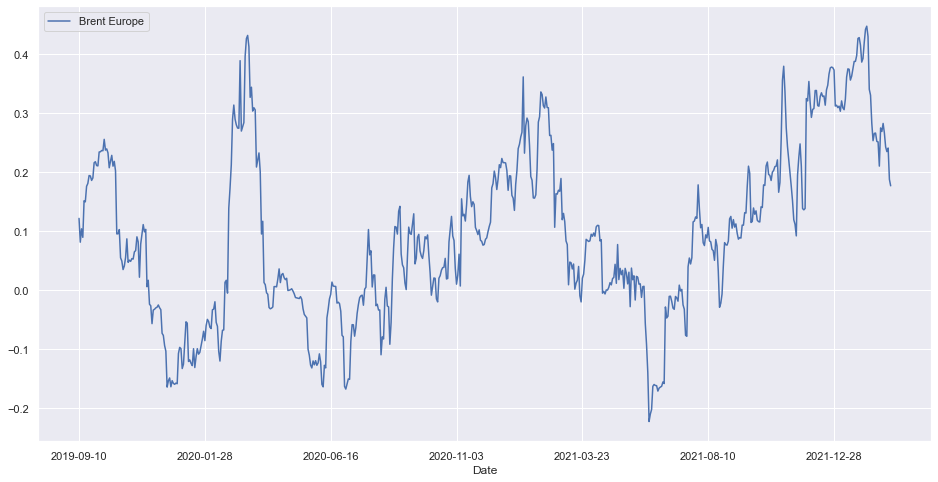

In [465]:
factor_corr_50['SALMAR'].iloc[split+20:][[
#                                          'Baltic Dry Index',
#                                          'WTI Crude Oil',
                                         'Brent Europe',
#                                          'Aluminium'
                                         ]].plot(figsize=(16,8))
plt.show()

In [475]:
print(f'Ratio of weighted trades: {num_up_weighed_trades / len(S1[split+20:]):.2%}')

Ratio of weighted trades: 0.72%


In [477]:
pd.Series(strategy_weights_list).value_counts()

VLCC            4
Gold Bullion    1
dtype: int64

In [478]:
strategy_weights_dict

{2: 5, 2.2: 0, 3: 0}

In [509]:
returns_f

{'10_644': '14.55%', '125_823': '23.66%', '24_048': '11.29%'}

In [480]:
f_low

['Gold Bullion',
 'Baltic Dry Index',
 'Natural Gas - RFV',
 'Fish Pool Spot',
 'Silver',
 'VLCC']

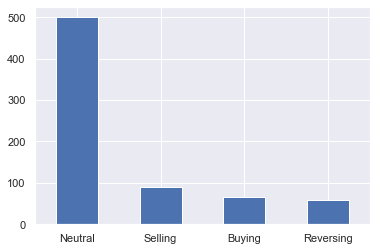

In [256]:
state = pd.Series(state)
states = state.value_counts()
states.plot(kind='bar')
# plt.ylabel('Count')
plt.xticks(rotation='360')
plt.show()

## Running strategy on several pairs

### Finland (TRADE)

#### TRADE_1

In [281]:
split = int(len(test_pair) * 0.70)
# print(split)

cutoff_inner = 0.2
cutoff_outer = 1.2
short_window = 12
long_window = 80



for pair_name in FINLAND_PAIRS_LIST:
    
    pair = pd.read_excel('Finland_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1_trade = pair.iloc[:,0][split:]
    S2_trade = pair.iloc[:,1][split:]
    
    ### Running strategy on pair

    strategy_profit,num_trades, num_bulks, state, returns, returns_f\
    = TRADE_1(S1_trade,
              S2_trade,
              short_window = short_window,
              long_window = short_window,
              cutoff_inner = cutoff_inner,
              cutoff_outer = cutoff_outer,
              rolling_z=False,
              print_actions=False)
    print(f'{strategy_profit:<7.2%} -> {S1_trade.name} | {S2_trade.name}')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}') 

16.03%  -> STORA ENSO R | STOREBRAND
14.76%  -> NELES | TOMRA SYSTEMS
6.88%   -> PONSSE | ATEA
9.01%   -> FISKARS 'A' | YARA INTERNATIONAL
8.04%   -> TIETOEVRY | ORKLA
8.14%   -> UPM-KYMMENE | BAKKAFROST
6.97%   -> KONECRANES | ATEA
8.18%   -> AKTIA BANK A | YARA INTERNATIONAL
7.80%   -> ASPO | ATEA
6.45%   -> KEMIRA | BAKKAFROST


#### TRADE_2

In [625]:
cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = False

for pair_name in FINLAND_PAIRS_LIST:
    
    pair = pd.read_excel('Finland_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    split = int(len(S1) * 0.70)
    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades = \
                                                                          \
                    TRADE_2(S1, S2,
                            short_window = 12,
                            long_window = 80,
                            cutoff_inner = cutoff_inner,
                            cutoff_outer = cutoff_outer,
                            rolling_z=False,
                            print_actions=False,
                            print_weighted=False)
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade

        rz = (r_trade - r_train.mean()) / r_train.std()
    
        plt.figure()
        plt.axhline(0, color='black')
        plt.axhline(cutoff_inner, color='black', linestyle='--')
        plt.axhline(-cutoff_inner, color='black', linestyle='--')
        plt.axhline(cutoff_outer, color='red', linestyle='--')
        plt.axhline(-cutoff_outer, color='green', linestyle='--')

        rz.plot(figsize=(16,8))
        plt.show()
        

STORA ENSO R | STOREBRAND

strategy_profit_M = 780,075 NOK
strategy_profit_P_tot = 780.08%
strategy_profit_trade_avg = 16.50%

Num trades: 381.0
Num up-weighted trades: 30
Num trade bulks initialized: 19

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤

NELES | TOMRA SYSTEMS

strategy_profit_M = -0 NOK
strategy_profit_P_tot = -0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 695
Num up-weighted trades: 23
Num trade bulks initialized: 2

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤

PONSSE | ATEA

strategy_profit_M = 358,566 NOK
strategy_profit_P_tot = 358.57%
strategy_profit_trade_avg = 10.33%

Num trades: 74
Num up-weighted trades: 37
Num trade bulks initialized: 11

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤

FISKARS 'A' | YARA INTERNATIONAL

strategy_profit_M = 149,701 NOK
strategy_profit_P_tot = 149.70%
strategy_profit_trade_avg = 4.39%

Num trades: 227
Num up-weighted trades: 5
Num trade bulks initialized: 18

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤

#### TRADE_4

In [1248]:
cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = True
plot_good_days = True

for i, pair_name in enumerate(FINLAND_PAIRS_LIST):
    
    pair = pd.read_excel('Finland_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
        
    split = int(len(S1) * 0.70)

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state_d, state_l, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades, W, corr_strength,\
    start_date_test, top_2_factors, Good_days = \
                                                \
                TRADE_4(S1, S2,
                        short_window = 12,
                        long_window = 80,
                        cutoff_inner = cutoff_inner,
                        cutoff_outer = cutoff_outer,
                        rolling_z=False,
                        print_actions=False,
                        print_weighted=False)
    
#     print(f'{Good_days=}')
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        ### Preparing data to be plotted
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]
        
        assert S1_trade.isnull().sum() == 0, "nul"
        assert S2_trade.isnull().sum() == 0, "nul"

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade
        
        rz = (r_trade - r_train.mean()) / r_train.std()
        
        
        df = pd.DataFrame(index=state_d.keys())
        
        df['State'] = state_d.values()
        action_index = df[df['State'] != 'Neutral'].index

        df['ratio'] = rz
        df['trade weight'] = W
        df['correlaion strength'] = corr_strength.values()
        df['Action_points'] = df['ratio'][action_index]
        
        df.reset_index(inplace=True)

        fig = px.scatter(df, x='index', y='Action_points',
                          color='State',
                          color_discrete_map={
                            "Neutral": 'grey',
                            "Selling": "crimson", # crimson, indianred, lightcoral, orangered, violet, tomato
                            "Selling Amplified": "blueviolet", # blueviolet, indigo, magenta
                            "Buying": "dodgerblue",
                            "Buying Amplified": "royalblue",  # mediumblue, navy, purple, royalblue 
                            "Reversing": '#2ca02c'},  # seagreen 
                          size='trade weight',
                          hover_name = 'State',

                           hover_data={'State':False, 
                                       'ratio':':.2f',
                                       'Action_points': False,
                                       'correlaion strength': True

                                    })

        fig2 = px.line(df, x='index', y='ratio')

        fig.add_trace(fig2.data[0])
        

        if plot_good_days:
        
            for day in Good_days.keys():
                fig.add_vline(x=day, line_width=1, line_color='orange', opacity=0.3)

        fig.add_hline(y=0, line_width=2, line_dash='dot')

        fig.add_hrect(y0=cutoff_outer, y1=max(df['ratio'].max(), 2),
                      annotation_text="Selling Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="red", opacity=0.1, line_width=0
                      )
        fig.add_hrect(y0=-cutoff_outer, y1=min(df['ratio'].min(), -2),
                      annotation_text="Buying Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="green", opacity=0.1, line_width=0
                      )

        fig.update_layout(hovermode=None) # | "x" | "x unified" | "y" | "y unified" |
        fig.update_layout(
        legend_title = 'State of trade',
        yaxis_title = None,
        xaxis_title = None)
        fig.show()

STORA ENSO R | STOREBRAND

strategy_profit_M = 164,664 NOK
strategy_profit_P_tot = 16.47%
strategy_profit_trade_avg = 20.96%

Num trades: 66.0
Num up-weighted trades: 30
Num trade bulks initialized: 18

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

NELES | TOMRA SYSTEMS

strategy_profit_M = -44,495 NOK
strategy_profit_P_tot = -4.45%
strategy_profit_trade_avg = -2.29%

Num trades: 33.0
Num up-weighted trades: 23
Num trade bulks initialized: 2

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

PONSSE | ATEA

strategy_profit_M = 292,384 NOK
strategy_profit_P_tot = 29.24%
strategy_profit_trade_avg = 15.26%

Num trades: 33.2
Num up-weighted trades: 37
Num trade bulks initialized: 12

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

FISKARS 'A' | YARA INTERNATIONAL

strategy_profit_M = 217,733 NOK
strategy_profit_P_tot = 21.77%
strategy_profit_trade_avg = 6.83%

Num trades: 66.0
Num up-weighted trades: 5
Num trade bulks initialized: 18

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

TIETOEVRY | ORKLA

strategy_profit_M = 254,640 NOK
strategy_profit_P_tot = 25.46%
strategy_profit_trade_avg = 9.41%

Num trades: 57.4
Num up-weighted trades: 49
Num trade bulks initialized: 12

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

UPM-KYMMENE | BAKKAFROST

strategy_profit_M = 245,896 NOK
strategy_profit_P_tot = 24.59%
strategy_profit_trade_avg = 19.66%

Num trades: 42
Num up-weighted trades: 41
Num trade bulks initialized: 20

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

KONECRANES | ATEA

strategy_profit_M = -200,983 NOK
strategy_profit_P_tot = -20.10%
strategy_profit_trade_avg = -9.92%

Num trades: 89.0
Num up-weighted trades: 37
Num trade bulks initialized: 12

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

AKTIA BANK A | YARA INTERNATIONAL

strategy_profit_M = 16,791 NOK
strategy_profit_P_tot = 1.68%
strategy_profit_trade_avg = 8.28%

Num trades: 93.0
Num up-weighted trades: 5
Num trade bulks initialized: 26

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ASPO | ATEA

strategy_profit_M = 164,000 NOK
strategy_profit_P_tot = 16.40%
strategy_profit_trade_avg = 5.40%

Num trades: 104.0
Num up-weighted trades: 37
Num trade bulks initialized: 19

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

KEMIRA | BAKKAFROST

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 0
Num up-weighted trades: 41
Num trade bulks initialized: 0

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Comparing strategies

In [627]:
cutoff_inner = 0.2
cutoff_outer = 1.2

for pair_name in FINLAND_PAIRS_LIST:
    
    pair = pd.read_excel('Finland_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    S1_trade = S1[split:]
    S1_trade = S2[split:]

    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"
    
    ### TRADE_1

    strategy_profit_1, num_trades_1, num_bulks_1, state_1, returns_1, returns_f_1\
    = TRADE_1(S1_trade,
              S2_trade,
              short_window = short_window,
              long_window = short_window,
              cutoff_inner = cutoff_inner,
              cutoff_outer = cutoff_outer,
              rolling_z=False,
              print_actions=False)
    
#     print(f'{strategy_profit:<7.2%} -> {S1_trade.name} | {S2_trade.name}')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}')

    ### TRADE_2

    strategy_profit_M, strategy_profit_2, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades_2 = \
                                                                          \
                    TRADE_2(S1, S2,
                            short_window = 12,
                            long_window = 80,
                            cutoff_inner = cutoff_inner,
                            cutoff_outer = cutoff_outer,
                            rolling_z=False,
                            print_actions=False,
                            print_weighted=False)
    
#     print(f'{strategy_profit:<7.2%} -> {S1.name} | {S2.name}')
#     print(f'{pair_name} -> {num_up_weighed_trades = }')
#     print(f'{strategy_profit = :.2%}\n')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}')
    
    
    print(f'PAIR -> {S1.name} | {S2.name} \n')
    print(f'{strategy_profit_1 = :.2%}\n{strategy_profit_2 = :.2%}\n\
number of weighted trades: {num_up_weighed_trades_2} \n\n')
    
    

PAIR -> STORA ENSO R | STOREBRAND 

strategy_profit_1 = 13.62%
strategy_profit_2 = 780.08%
number of weighted trades: 30 


PAIR -> NELES | TOMRA SYSTEMS 

strategy_profit_1 = 18.32%
strategy_profit_2 = -0.00%
number of weighted trades: 23 


PAIR -> PONSSE | ATEA 

strategy_profit_1 = 10.75%
strategy_profit_2 = 358.57%
number of weighted trades: 37 


PAIR -> FISKARS 'A' | YARA INTERNATIONAL 

strategy_profit_1 = 10.06%
strategy_profit_2 = 149.70%
number of weighted trades: 5 


PAIR -> TIETOEVRY | ORKLA 

strategy_profit_1 = 11.03%
strategy_profit_2 = 605.91%
number of weighted trades: 49 


PAIR -> UPM-KYMMENE | BAKKAFROST 

strategy_profit_1 = 9.95%
strategy_profit_2 = 2309.64%
number of weighted trades: 41 


PAIR -> KONECRANES | ATEA 

strategy_profit_1 = 10.75%
strategy_profit_2 = 0.00%
number of weighted trades: 37 


PAIR -> AKTIA BANK A | YARA INTERNATIONAL 

strategy_profit_1 = 10.06%
strategy_profit_2 = 69.50%
number of weighted trades: 5 


PAIR -> ASPO | ATEA 

strategy_p

### Canada (TRADE)

#### TRADE_1

In [628]:
split = int(len(test_pair) * 0.70)
# print(split)

cutoff_inner = 0.2
cutoff_outer = 1.2
short_window = 12
long_window = 80



for pair_name in CANADA_PAIRS_LIST:
    
    pair = pd.read_excel('Canada_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1_trade = pair.iloc[:,0][split:]
    S2_trade = pair.iloc[:,1][split:]
    
    ### Running strategy on pair

    strategy_profit,num_trades, num_bulks, state, returns, returns_f\
    = TRADE_1(S1_trade,
              S2_trade,
              short_window = short_window,
              long_window = short_window,
              cutoff_inner = cutoff_inner,
              cutoff_outer = cutoff_outer,
              rolling_z=False,
              print_actions=False)
    print(f'{strategy_profit:<7.2%} -> {S1_trade.name} | {S2_trade.name}')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}') 

10.91%  -> CAE | ATEA
11.22%  -> CAE | MOWI
5.64%   -> SUN LIFE FINL. | GJENSIDIGE FORSIKRING
4.90%   -> INTACT FINANCIAL | GJENSIDIGE FORSIKRING
4.60%   -> CANADIAN NATIONAL RY. | GJENSIDIGE FORSIKRING
8.70%   -> PEMBINA PIPELINE | MOWI
9.84%   -> METRO | AF GRUPPEN 'A'
8.23%   -> MANULIFE FINANCIAL | ATEA
8.96%   -> CONSTELLATION SOFTWARE | TOMRA SYSTEMS
3.93%   -> TELUS | GJENSIDIGE FORSIKRING
4.86%   -> CGI | MOWI
10.61%  -> BROOKFIELD ASSET MAN.'A' (NYS) | GJENSIDIGE FORSIKRING
12.62%  -> PEMBINA PIPELINE | LEROY SEAFOOD GROUP
7.14%   -> ALIMENTATION COUCHE TARD MULTI VOTING A | AF GRUPPEN 'A'
6.86%   -> BCE | AF GRUPPEN 'A'
13.90%  -> WESTON GEORGE | VEIDEKKE
6.53%   -> OPEN TEXT (NAS) | BAKKAFROST
13.14%  -> SHAW COMMS.'B' | YARA INTERNATIONAL
7.65%   -> ROGERS COMMS.'B' | MOWI


#### TRADE_2

In [629]:
cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = False

for pair_name in CANADA_PAIRS_LIST:
    
    pair = pd.read_excel('Canada_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    split = int(len(S1) * 0.70)
    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades = \
                                                                          \
                    TRADE_2(S1, S2,
                            short_window = 12,
                            long_window = 80,
                            cutoff_inner = cutoff_inner,
                            cutoff_outer = cutoff_outer,
                            rolling_z=False,
                            print_actions=False,
                            print_weighted=False)
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade

        rz = (r_trade - r_train.mean()) / r_train.std()
    
        plt.figure()
        plt.axhline(0, color='black')
        plt.axhline(cutoff_inner, color='black', linestyle='--')
        plt.axhline(-cutoff_inner, color='black', linestyle='--')
        plt.axhline(cutoff_outer, color='red', linestyle='--')
        plt.axhline(-cutoff_outer, color='green', linestyle='--')

        rz.plot(figsize=(16,8))
        plt.show()

CAE | ATEA

strategy_profit_M = 35,090,077 NOK
strategy_profit_P_tot = 35090.08%
strategy_profit_trade_avg = 10.31%

Num trades: 807.1999999999999
Num up-weighted trades: 37
Num trade bulks initialized: 20

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤

CAE | MOWI

strategy_profit_M = 20,087,144 NOK
strategy_profit_P_tot = 20087.14%
strategy_profit_trade_avg = 24.44%

Num trades: 266
Num up-weighted trades: 55
Num trade bulks initialized: 6

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤

SUN LIFE FINL. | GJENSIDIGE FORSIKRING

strategy_profit_M = 122,725 NOK
strategy_profit_P_tot = 122.72%
strategy_profit_trade_avg = 5.63%

Num trades: 386
Num up-weighted trades: 48
Num trade bulks initialized: 22

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤

INTACT FINANCIAL | GJENSIDIGE FORSIKRING

strategy_profit_M = 141,891 NOK
strategy_profit_P_tot = 141.89%
strategy_profit_trade_avg = 3.88%

Num trades: 656.2
Num up-weighted trades: 48
Num trade bulks initialized: 30

¤¤¤¤¤¤¤¤¤¤¤

### TRADE_4

In [1245]:
cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = True
plot_good_days = True

for i, pair_name in enumerate(CANADA_PAIRS_LIST):
    
    pair = pd.read_excel('Canada_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
        
    split = int(len(S1) * 0.70)

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state_d, state_l, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades, W, corr_strength,\
    start_date_test, top_2_factors, Good_days = \
                                                \
                TRADE_4(S1, S2,
                        short_window = 12,
                        long_window = 80,
                        cutoff_inner = cutoff_inner,
                        cutoff_outer = cutoff_outer,
                        rolling_z=False,
                        print_actions=False,
                        print_weighted=False)
    
#     print(f'{Good_days=}')
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        ### Preparing data to be plotted
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]
        
        assert S1_trade.isnull().sum() == 0, "nul"
        assert S2_trade.isnull().sum() == 0, "nul"

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade
        
        rz = (r_trade - r_train.mean()) / r_train.std()
        
        
        df = pd.DataFrame(index=state_d.keys())
        
        df['State'] = state_d.values()
        action_index = df[df['State'] != 'Neutral'].index

        df['ratio'] = rz
        df['trade weight'] = W
        df['correlaion strength'] = corr_strength.values()
        df['Action_points'] = df['ratio'][action_index]
        
        df.reset_index(inplace=True)

        fig = px.scatter(df, x='index', y='Action_points',
                          color='State',
                          color_discrete_map={
                            "Neutral": 'grey',
                            "Selling": "crimson", # crimson, indianred, lightcoral, orangered, violet, tomato
                            "Selling Amplified": "blueviolet", # blueviolet, indigo, magenta
                            "Buying": "dodgerblue",
                            "Buying Amplified": "royalblue",  # mediumblue, navy, purple, royalblue 
                            "Reversing": '#2ca02c'},  # seagreen 
                          size='trade weight',
                          hover_name = 'State',

                           hover_data={'State':False, 
                                       'ratio':':.2f',
                                       'Action_points': False,
                                       'correlaion strength': True

                                    })

        fig2 = px.line(df, x='index', y='ratio')

        fig.add_trace(fig2.data[0])
        

        if plot_good_days:
        
            for day in Good_days.keys():
                fig.add_vline(x=day, line_width=1, line_color='orange', opacity=0.3)

        fig.add_hline(y=0, line_width=2, line_dash='dot')

        fig.add_hrect(y0=cutoff_outer, y1=max(df['ratio'].max(), 2),
                      annotation_text="Selling Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="red", opacity=0.1, line_width=0
                      )
        fig.add_hrect(y0=-cutoff_outer, y1=min(df['ratio'].min(), -2),
                      annotation_text="Buying Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="green", opacity=0.1, line_width=0
                      )

        fig.update_layout(hovermode=None) # | "x" | "x unified" | "y" | "y unified" |
        fig.update_layout(
        legend_title = 'State of trade',
        yaxis_title = None,
        xaxis_title = None)
        fig.show()

CAE | ATEA

strategy_profit_M = 1,941,501 NOK
strategy_profit_P_tot = 194.15%
strategy_profit_trade_avg = 7.50%

Num trades: 69.0
Num up-weighted trades: 37
Num trade bulks initialized: 16

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CAE | MOWI

strategy_profit_M = 662,045 NOK
strategy_profit_P_tot = 66.20%
strategy_profit_trade_avg = 26.60%

Num trades: 8.0
Num up-weighted trades: 55
Num trade bulks initialized: 1

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

SUN LIFE FINL. | GJENSIDIGE FORSIKRING

strategy_profit_M = 45,453 NOK
strategy_profit_P_tot = 4.55%
strategy_profit_trade_avg = 8.40%

Num trades: 90.0
Num up-weighted trades: 48
Num trade bulks initialized: 22

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

INTACT FINANCIAL | GJENSIDIGE FORSIKRING

strategy_profit_M = 49,085 NOK
strategy_profit_P_tot = 4.91%
strategy_profit_trade_avg = 6.21%

Num trades: 123.4
Num up-weighted trades: 48
Num trade bulks initialized: 30

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CANADIAN NATIONAL RY. | GJENSIDIGE FORSIKRING

strategy_profit_M = 42,661 NOK
strategy_profit_P_tot = 4.27%
strategy_profit_trade_avg = 5.66%

Num trades: 12
Num up-weighted trades: 48
Num trade bulks initialized: 4

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

PEMBINA PIPELINE | MOWI

strategy_profit_M = 64,113 NOK
strategy_profit_P_tot = 6.41%
strategy_profit_trade_avg = 6.77%

Num trades: 48.0
Num up-weighted trades: 55
Num trade bulks initialized: 18

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

METRO | AF GRUPPEN A

strategy_profit_M = 246,027 NOK
strategy_profit_P_tot = 24.60%
strategy_profit_trade_avg = 9.79%

Num trades: 31.4
Num up-weighted trades: 51
Num trade bulks initialized: 11

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

MANULIFE FINANCIAL | ATEA

strategy_profit_M = 18,025 NOK
strategy_profit_P_tot = 1.80%
strategy_profit_trade_avg = 5.52%

Num trades: 84.0
Num up-weighted trades: 37
Num trade bulks initialized: 23

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CONSTELLATION SOFTWARE | TOMRA SYSTEMS

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 0
Num up-weighted trades: 23
Num trade bulks initialized: 0

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

TELUS | GJENSIDIGE FORSIKRING

strategy_profit_M = 36,172 NOK
strategy_profit_P_tot = 3.62%
strategy_profit_trade_avg = 5.89%

Num trades: 138.0
Num up-weighted trades: 48
Num trade bulks initialized: 35

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CGI | MOWI

strategy_profit_M = 332,661 NOK
strategy_profit_P_tot = 33.27%
strategy_profit_trade_avg = 10.73%

Num trades: 14
Num up-weighted trades: 55
Num trade bulks initialized: 5

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BROOKFIELD ASSET MAN.'A' (NYS) | GJENSIDIGE FORSIKRING

strategy_profit_M = 210,258 NOK
strategy_profit_P_tot = 21.03%
strategy_profit_trade_avg = 6.15%

Num trades: 105.0
Num up-weighted trades: 48
Num trade bulks initialized: 24

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

PEMBINA PIPELINE | LEROY SEAFOOD GROUP

strategy_profit_M = 65,219 NOK
strategy_profit_P_tot = 6.52%
strategy_profit_trade_avg = 7.24%

Num trades: 54.0
Num up-weighted trades: 72
Num trade bulks initialized: 23

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ALIMENTATION COUCHE TARD MULTI VOTING A | AF GRUPPEN A

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 0
Num up-weighted trades: 51
Num trade bulks initialized: 0

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BCE | AF GRUPPEN A

strategy_profit_M = 292,308 NOK
strategy_profit_P_tot = 29.23%
strategy_profit_trade_avg = 7.23%

Num trades: 16
Num up-weighted trades: 51
Num trade bulks initialized: 7

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

WESTON GEORGE | VEIDEKKE

strategy_profit_M = 171,567 NOK
strategy_profit_P_tot = 17.16%
strategy_profit_trade_avg = 4.02%

Num trades: 28.0
Num up-weighted trades: 64
Num trade bulks initialized: 11

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

OPEN TEXT (NAS) | BAKKAFROST

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 0
Num up-weighted trades: 41
Num trade bulks initialized: 0

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

SHAW COMMS.'B' | YARA INTERNATIONAL

strategy_profit_M = 598,771 NOK
strategy_profit_P_tot = 59.88%
strategy_profit_trade_avg = 6.47%

Num trades: 70.0
Num up-weighted trades: 5
Num trade bulks initialized: 28

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ROGERS COMMS.'B' | MOWI

strategy_profit_M = -43,557 NOK
strategy_profit_P_tot = -4.36%
strategy_profit_trade_avg = -2.19%

Num trades: 29
Num up-weighted trades: 55
Num trade bulks initialized: 14

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Comparing strategies

In [632]:
cutoff_inner = 0.2
cutoff_outer = 1.2

for pair_name in CANADA_PAIRS_LIST:
    
    pair = pd.read_excel('Canada_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    S1_trade = S1[split:]
    S1_trade = S2[split:]

    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"
    
    ### TRADE_1

    strategy_profit_1, num_trades_1, num_bulks_1, state_1, returns_1, returns_f_1\
    = TRADE_1(S1_trade,
              S2_trade,
              short_window = short_window,
              long_window = short_window,
              cutoff_inner = cutoff_inner,
              cutoff_outer = cutoff_outer,
              rolling_z=False,
              print_actions=False)
    
#     print(f'{strategy_profit:<7.2%} -> {S1_trade.name} | {S2_trade.name}')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}')

    ### TRADE_2

    strategy_profit_M, strategy_profit_2, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades_2 = \
                                                                          \
                    TRADE_2(S1, S2,
                            short_window = 12,
                            long_window = 80,
                            cutoff_inner = cutoff_inner,
                            cutoff_outer = cutoff_outer,
                            rolling_z=False,
                            print_actions=False,
                            print_weighted=False)
    
#     print(f'{strategy_profit:<7.2%} -> {S1.name} | {S2.name}')
#     print(f'{pair_name} -> {num_up_weighed_trades = }')
#     print(f'{strategy_profit = :.2%}\n')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}')
    
    
    print(f'PAIR -> {S1.name} | {S2.name} \n')
    print(f'{strategy_profit_1 = :.2%}\n{strategy_profit_2 = :.2%}\n\
number of weighted trades: {num_up_weighed_trades_2} \n\n')
    

PAIR -> CAE | ATEA 

strategy_profit_1 = 10.75%
strategy_profit_2 = 35090.08%
number of weighted trades: 37 


PAIR -> CAE | MOWI 

strategy_profit_1 = 0.00%
strategy_profit_2 = 20087.14%
number of weighted trades: 55 


PAIR -> SUN LIFE FINL. | GJENSIDIGE FORSIKRING 

strategy_profit_1 = 9.83%
strategy_profit_2 = 122.72%
number of weighted trades: 48 


PAIR -> INTACT FINANCIAL | GJENSIDIGE FORSIKRING 

strategy_profit_1 = 9.83%
strategy_profit_2 = 141.89%
number of weighted trades: 48 


PAIR -> CANADIAN NATIONAL RY. | GJENSIDIGE FORSIKRING 

strategy_profit_1 = 9.83%
strategy_profit_2 = -5.71%
number of weighted trades: 48 


PAIR -> PEMBINA PIPELINE | MOWI 

strategy_profit_1 = 0.00%
strategy_profit_2 = 0.00%
number of weighted trades: 55 


PAIR -> METRO | AF GRUPPEN A 

strategy_profit_1 = 7.36%
strategy_profit_2 = 775.68%
number of weighted trades: 51 


PAIR -> MANULIFE FINANCIAL | ATEA 

strategy_profit_1 = 10.75%
strategy_profit_2 = 0.00%
number of weighted trades: 37 


PAIR

### France (TRADE)

#### TRADE_1

In [633]:
split = int(len(test_pair) * 0.70)
# print(split)

cutoff_inner = 0.2
cutoff_outer = 1.2
short_window = 12
long_window = 80



for pair_name in FRANCE_PAIRS_LIST:
    
    pair = pd.read_excel('France_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1_trade = pair.iloc[:,0][split:]
    S2_trade = pair.iloc[:,1][split:]
    
    ### Running strategy on pair

    strategy_profit,num_trades, num_bulks, state, returns, returns_f\
    = TRADE_1(S1_trade,
              S2_trade,
              short_window = short_window,
              long_window = short_window,
              cutoff_inner = cutoff_inner,
              cutoff_outer = cutoff_outer,
              rolling_z=False,
              print_actions=False)
    print(f'{strategy_profit:<7.2%} -> {S1_trade.name} | {S2_trade.name}')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}') 

11.34%  -> CAPGEMINI | YARA INTERNATIONAL
14.10%  -> REMY COINTREAU | DNB BANK
6.44%   -> VINCI | MOWI
9.79%   -> ENGIE | ORKLA
10.35%  -> BUREAU VERITAS | DNB BANK
8.36%   -> VINCI | ORKLA
7.75%   -> TELEPERFORMANCE | TOMRA SYSTEMS
12.90%  -> LVMH | TOMRA SYSTEMS
8.73%   -> EIFFAGE | ORKLA
9.21%   -> TOTALENERGIES | AUSTEVOLL SEAFOOD
9.61%   -> BUREAU VERITAS | ATEA
8.94%   -> SAFRAN | TELENOR


#### TRADE_2

CAPGEMINI | YARA INTERNATIONAL

strategy_profit_M = 275,680 NOK
strategy_profit_P_tot = 275.68%
strategy_profit_trade_avg = 13.51%

Num trades: 580
Num up-weighted trades: 5
Num trade bulks initialized: 11

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



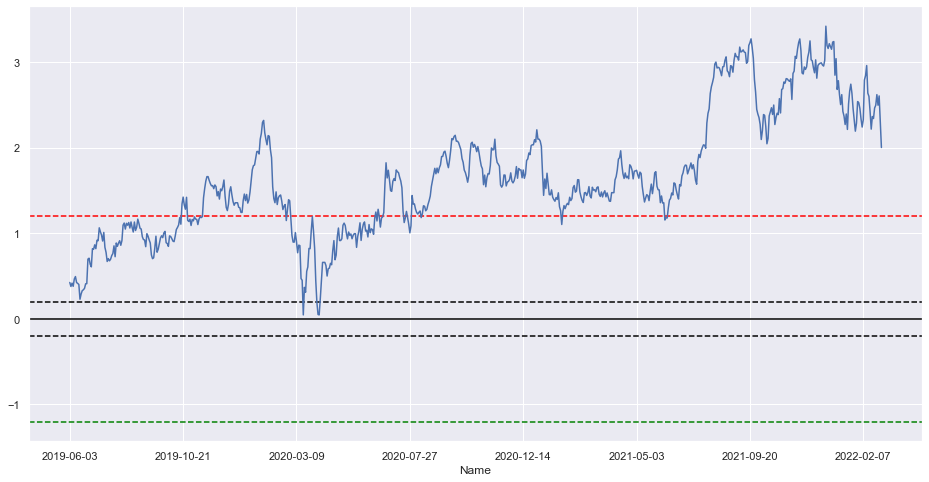

REMY COINTREAU | DNB BANK

strategy_profit_M = 100,768 NOK
strategy_profit_P_tot = 100.77%
strategy_profit_trade_avg = 11.39%

Num trades: 576
Num up-weighted trades: 21
Num trade bulks initialized: 8

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



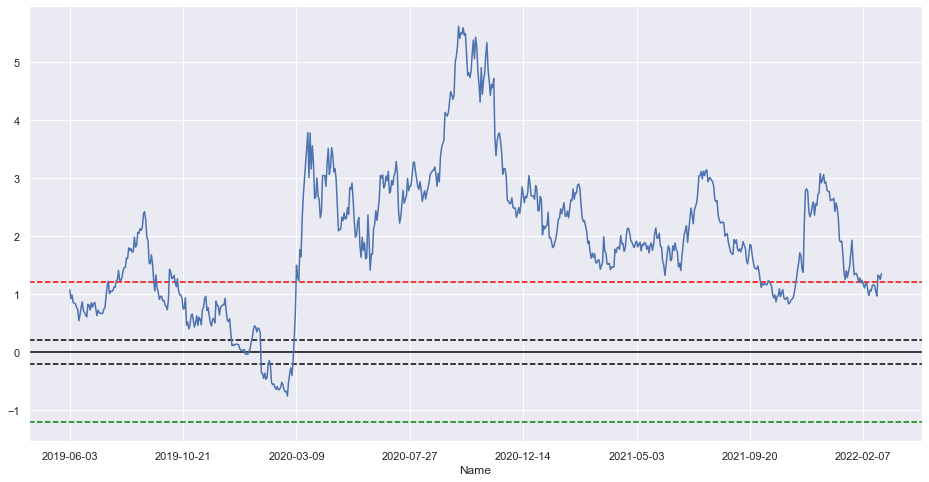

VINCI | MOWI

strategy_profit_M = 75,430 NOK
strategy_profit_P_tot = 75.43%
strategy_profit_trade_avg = 2.16%

Num trades: 260
Num up-weighted trades: 55
Num trade bulks initialized: 23

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



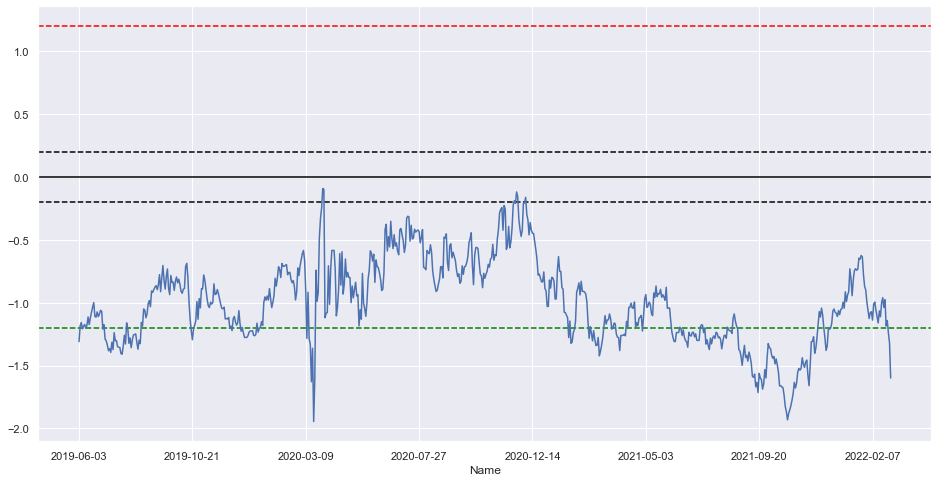

ENGIE | ORKLA

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 245
Num up-weighted trades: 49
Num trade bulks initialized: 14

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



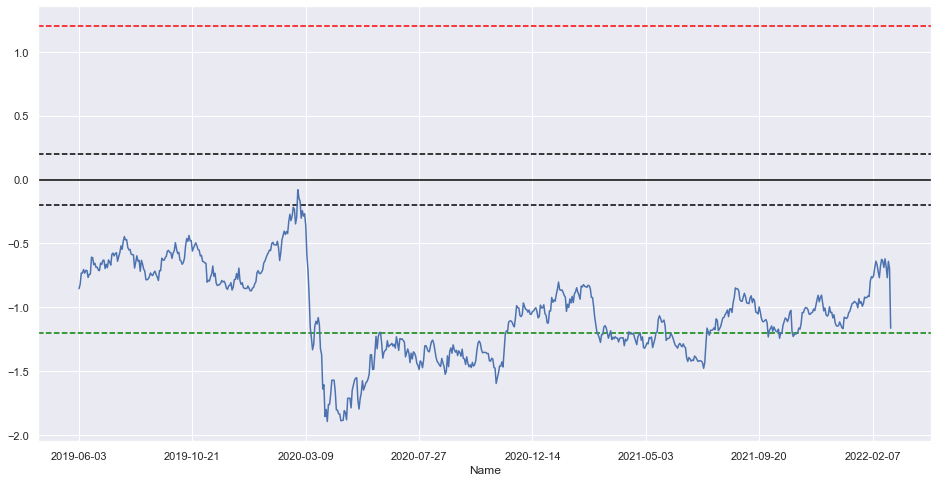

BUREAU VERITAS | DNB BANK

strategy_profit_M = 11,446 NOK
strategy_profit_P_tot = 11.45%
strategy_profit_trade_avg = 9.97%

Num trades: 91
Num up-weighted trades: 21
Num trade bulks initialized: 8

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



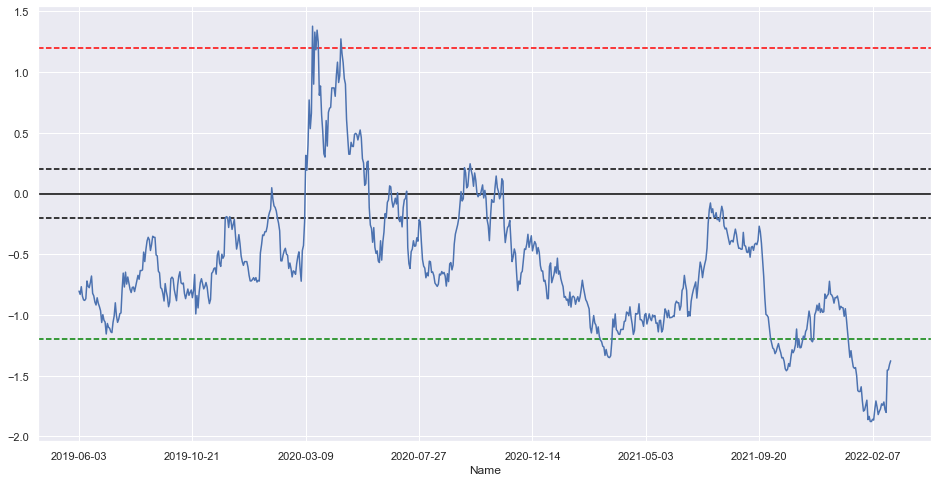

VINCI | ORKLA

strategy_profit_M = 1,828,702 NOK
strategy_profit_P_tot = 1828.70%
strategy_profit_trade_avg = 14.40%

Num trades: 557.4
Num up-weighted trades: 49
Num trade bulks initialized: 16

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



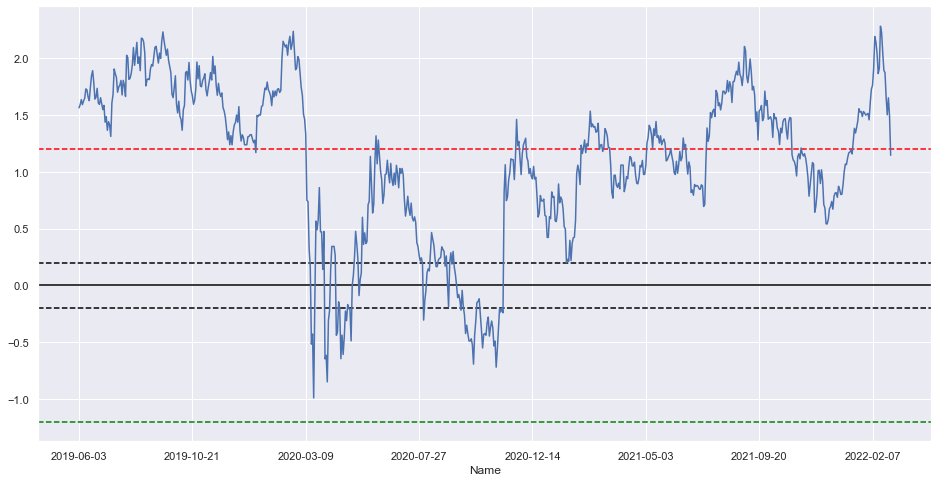

TELEPERFORMANCE | TOMRA SYSTEMS

strategy_profit_M = 1,101,435 NOK
strategy_profit_P_tot = 1101.44%
strategy_profit_trade_avg = 6.94%

Num trades: 58
Num up-weighted trades: 23
Num trade bulks initialized: 5

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



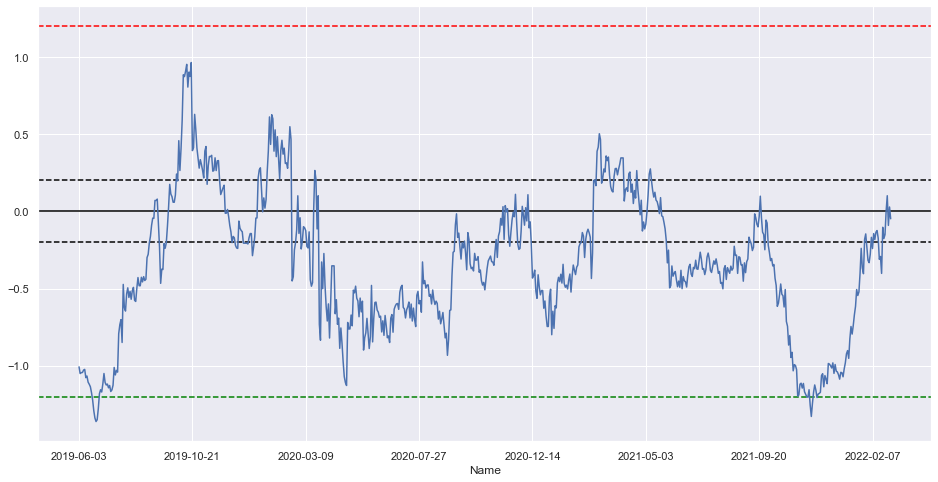

LVMH | TOMRA SYSTEMS

strategy_profit_M = 94,646,060 NOK
strategy_profit_P_tot = 94646.06%
strategy_profit_trade_avg = 12.76%

Num trades: 937.0
Num up-weighted trades: 23
Num trade bulks initialized: 11

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



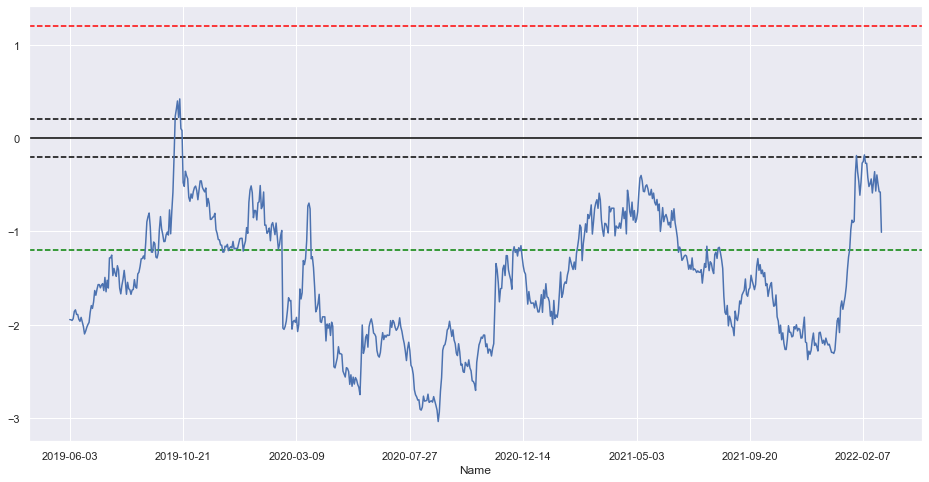

EIFFAGE | ORKLA

strategy_profit_M = 29,028,161 NOK
strategy_profit_P_tot = 29028.16%
strategy_profit_trade_avg = 15.22%

Num trades: 112.4
Num up-weighted trades: 49
Num trade bulks initialized: 6

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



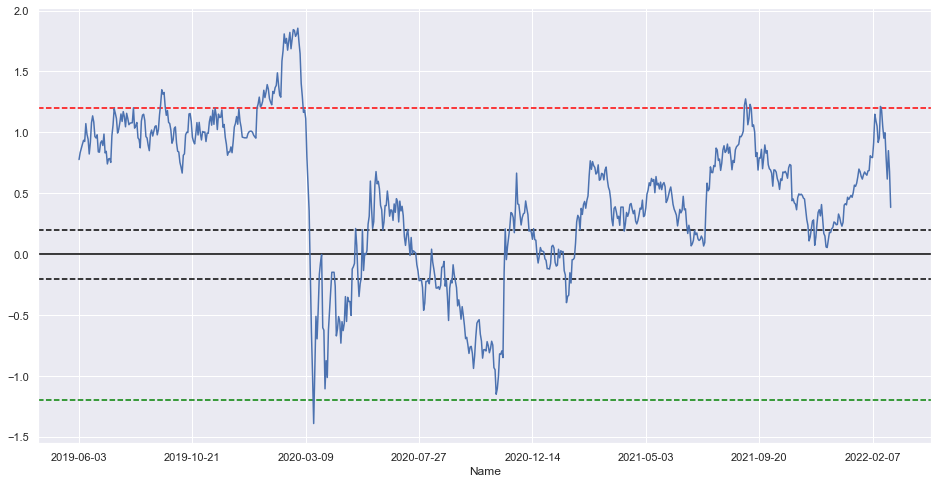

TOTALENERGIES | AUSTEVOLL SEAFOOD

strategy_profit_M = -0 NOK
strategy_profit_P_tot = -0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 302
Num up-weighted trades: 79
Num trade bulks initialized: 18

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



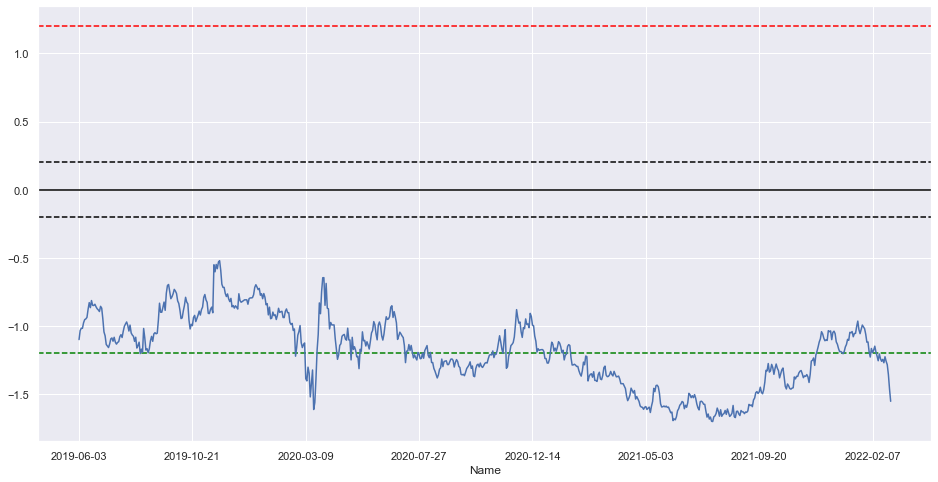

BUREAU VERITAS | ATEA

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 214
Num up-weighted trades: 37
Num trade bulks initialized: 14

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



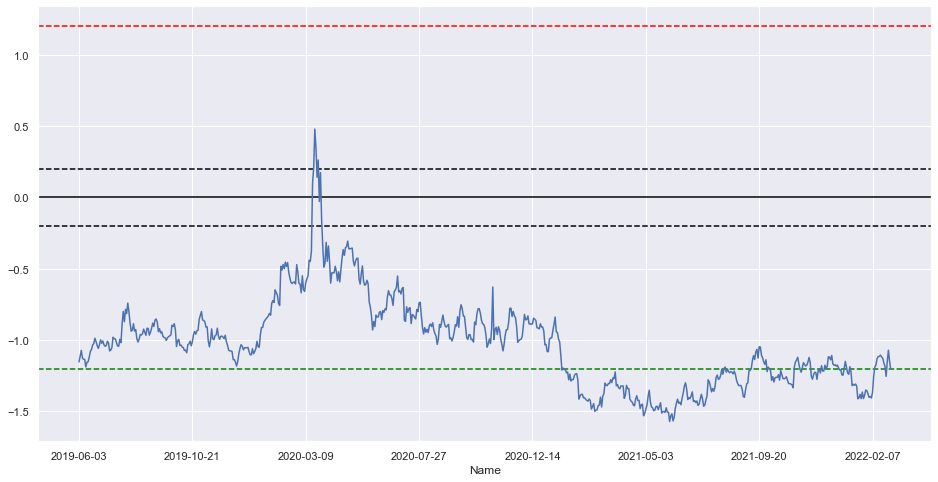

SAFRAN | TELENOR

strategy_profit_M = 79,379,186 NOK
strategy_profit_P_tot = 79379.19%
strategy_profit_trade_avg = 15.73%

Num trades: 832.4
Num up-weighted trades: 49
Num trade bulks initialized: 9

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



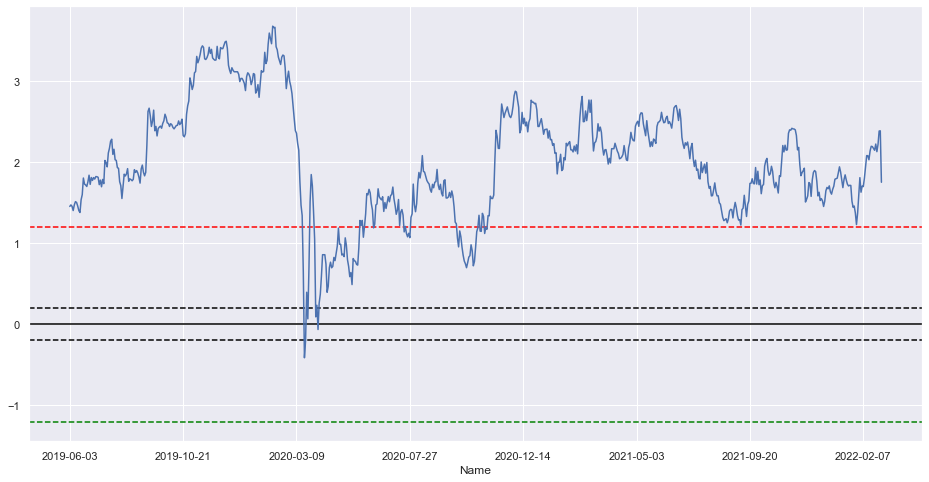

In [637]:
cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = True

for pair_name in FRANCE_PAIRS_LIST:
    
    pair = pd.read_excel('France_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    split = int(len(S1) * 0.70)
    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades = \
                                                                          \
                    TRADE_2(S1, S2,
                            short_window = 12,
                            long_window = 80,
                            cutoff_inner = cutoff_inner,
                            cutoff_outer = cutoff_outer,
                            rolling_z=False,
                            print_actions=False,
                            print_weighted=False)
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade

        rz = (r_trade - r_train.mean()) / r_train.std()
    
        plt.figure()
        plt.axhline(0, color='black')
        plt.axhline(cutoff_inner, color='black', linestyle='--')
        plt.axhline(-cutoff_inner, color='black', linestyle='--')
        plt.axhline(cutoff_outer, color='red', linestyle='--')
        plt.axhline(-cutoff_outer, color='green', linestyle='--')

        rz.plot(figsize=(16,8))
        plt.show()

### TRADE_4

In [1236]:
cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = True
plot_good_days = True

for i, pair_name in enumerate(FRANCE_PAIRS_LIST):
    
    pair = pd.read_excel('France_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
        
    split = int(len(S1) * 0.70)

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state_d, state_l, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades, W, corr_strength,\
    start_date_test, top_2_factors, Good_days = \
                                                \
                TRADE_4(S1, S2,
                        short_window = 12,
                        long_window = 80,
                        cutoff_inner = cutoff_inner,
                        cutoff_outer = cutoff_outer,
                        rolling_z=False,
                        print_actions=False,
                        print_weighted=False)
    
#     print(f'{Good_days=}')
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        ### Preparing data to be plotted
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]
        
        assert S1_trade.isnull().sum() == 0, "nul"
        assert S2_trade.isnull().sum() == 0, "nul"

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade
        
        rz = (r_trade - r_train.mean()) / r_train.std()
        
        
        df = pd.DataFrame(index=state_d.keys())
        
        df['State'] = state_d.values()
        action_index = df[df['State'] != 'Neutral'].index

        df['ratio'] = rz
        df['trade weight'] = W
        df['correlaion strength'] = corr_strength.values()
        df['Action_points'] = df['ratio'][action_index]
        
        df.reset_index(inplace=True)

        fig = px.scatter(df, x='index', y='Action_points',
                          color='State',
                          color_discrete_map={
                            "Neutral": 'grey',
                            "Selling": "crimson", # crimson, indianred, lightcoral, orangered, violet, tomato
                            "Selling Amplified": "blueviolet", # blueviolet, indigo, magenta
                            "Buying": "dodgerblue",
                            "Buying Amplified": "royalblue",  # mediumblue, navy, purple, royalblue 
                            "Reversing": '#2ca02c'},  # seagreen 
                          size='trade weight',
                          hover_name = 'State',

                           hover_data={'State':False, 
                                       'ratio':':.2f',
                                       'Action_points': False,
                                       'correlaion strength': True

                                    })

        fig2 = px.line(df, x='index', y='ratio')

        fig.add_trace(fig2.data[0])
        

        if plot_good_days:
        
            for day in Good_days.keys():
                fig.add_vline(x=day, line_width=1, line_color='orange', opacity=0.3)

        fig.add_hline(y=0, line_width=2, line_dash='dot')

        fig.add_hrect(y0=cutoff_outer, y1=max(df['ratio'].max(), 2),
                      annotation_text="Selling Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="red", opacity=0.1, line_width=0
                      )
        fig.add_hrect(y0=-cutoff_outer, y1=min(df['ratio'].min(), -2),
                      annotation_text="Buying Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="green", opacity=0.1, line_width=0
                      )

        fig.update_layout(hovermode=None) # | "x" | "x unified" | "y" | "y unified" |
        fig.update_layout(
        legend_title = 'State of trade',
        yaxis_title = None,
        xaxis_title = None)
        fig.show()

CAPGEMINI | YARA INTERNATIONAL

strategy_profit_M = 15,567 NOK
strategy_profit_P_tot = 1.56%
strategy_profit_trade_avg = 11.98%

Num trades: 30.0
Num up-weighted trades: 5
Num trade bulks initialized: 11

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

REMY COINTREAU | DNB BANK

strategy_profit_M = 11,778 NOK
strategy_profit_P_tot = 1.18%
strategy_profit_trade_avg = 10.46%

Num trades: 36.0
Num up-weighted trades: 21
Num trade bulks initialized: 10

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

VINCI | MOWI

strategy_profit_M = 86,575 NOK
strategy_profit_P_tot = 8.66%
strategy_profit_trade_avg = 12.97%

Num trades: 40.0
Num up-weighted trades: 55
Num trade bulks initialized: 24

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ENGIE | ORKLA

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 18
Num up-weighted trades: 49
Num trade bulks initialized: 14

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BUREAU VERITAS | DNB BANK

strategy_profit_M = 2,676 NOK
strategy_profit_P_tot = 0.27%
strategy_profit_trade_avg = 11.20%

Num trades: 18
Num up-weighted trades: 21
Num trade bulks initialized: 8

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

VINCI | ORKLA

strategy_profit_M = 156,781 NOK
strategy_profit_P_tot = 15.68%
strategy_profit_trade_avg = 9.82%

Num trades: 61.0
Num up-weighted trades: 49
Num trade bulks initialized: 16

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

TELEPERFORMANCE | TOMRA SYSTEMS

strategy_profit_M = 178,281 NOK
strategy_profit_P_tot = 17.83%
strategy_profit_trade_avg = 10.53%

Num trades: 8
Num up-weighted trades: 23
Num trade bulks initialized: 3

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

LVMH | TOMRA SYSTEMS

strategy_profit_M = 386,707 NOK
strategy_profit_P_tot = 38.67%
strategy_profit_trade_avg = 16.71%

Num trades: 6
Num up-weighted trades: 23
Num trade bulks initialized: 3

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

EIFFAGE | ORKLA

strategy_profit_M = 310,318 NOK
strategy_profit_P_tot = 31.03%
strategy_profit_trade_avg = 15.65%

Num trades: 3
Num up-weighted trades: 49
Num trade bulks initialized: 1

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

TOTALENERGIES | AUSTEVOLL SEAFOOD

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 2
Num up-weighted trades: 79
Num trade bulks initialized: 2

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BUREAU VERITAS | ATEA

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 15
Num up-weighted trades: 37
Num trade bulks initialized: 15

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

SAFRAN | TELENOR

strategy_profit_M = 254,742 NOK
strategy_profit_P_tot = 25.47%
strategy_profit_trade_avg = 14.76%

Num trades: 4
Num up-weighted trades: 49
Num trade bulks initialized: 3

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Comparing Strategies

In [636]:
cutoff_inner = 0.2
cutoff_outer = 1.2

for pair_name in FRANCE_PAIRS_LIST:
    
    pair = pd.read_excel('France_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    S1_trade = S1[split:]
    S1_trade = S2[split:]

    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"
    
    ### TRADE_1

    strategy_profit_1, num_trades_1, num_bulks_1, state_1, returns_1, returns_f_1\
    = TRADE_1(S1_trade,
              S2_trade,
              short_window = short_window,
              long_window = short_window,
              cutoff_inner = cutoff_inner,
              cutoff_outer = cutoff_outer,
              rolling_z=False,
              print_actions=False)
    
#     print(f'{strategy_profit:<7.2%} -> {S1_trade.name} | {S2_trade.name}')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}')

    ### TRADE_2

    strategy_profit_M, strategy_profit_2, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades_2 = \
                                                                          \
                    TRADE_2(S1, S2,
                            short_window = 12,
                            long_window = 80,
                            cutoff_inner = cutoff_inner,
                            cutoff_outer = cutoff_outer,
                            rolling_z=False,
                            print_actions=False,
                            print_weighted=False)
    
#     print(f'{strategy_profit:<7.2%} -> {S1.name} | {S2.name}')
#     print(f'{pair_name} -> {num_up_weighed_trades = }')
#     print(f'{strategy_profit = :.2%}\n')
#     print(f'Num trades: {num_trades}')
#     print(f'Num trade bulks initialized: {num_bulks}')
    
    
    print(f'PAIR -> {S1.name} | {S2.name} \n')
    print(f'{strategy_profit_1 = :.2%}\n{strategy_profit_2 = :.2%}\n\
number of weighted trades: {num_up_weighed_trades_2} \n\n')
    

PAIR -> CAPGEMINI | YARA INTERNATIONAL 

strategy_profit_1 = 12.79%
strategy_profit_2 = 275.68%
number of weighted trades: 5 


PAIR -> REMY COINTREAU | DNB BANK 

strategy_profit_1 = 18.32%
strategy_profit_2 = 100.77%
number of weighted trades: 21 


PAIR -> VINCI | MOWI 

strategy_profit_1 = 8.35%
strategy_profit_2 = 75.43%
number of weighted trades: 55 


PAIR -> ENGIE | ORKLA 

strategy_profit_1 = 9.34%
strategy_profit_2 = 0.00%
number of weighted trades: 49 


PAIR -> BUREAU VERITAS | DNB BANK 

strategy_profit_1 = 18.32%
strategy_profit_2 = 11.45%
number of weighted trades: 21 


PAIR -> VINCI | ORKLA 

strategy_profit_1 = 9.34%
strategy_profit_2 = 1828.70%
number of weighted trades: 49 


PAIR -> TELEPERFORMANCE | TOMRA SYSTEMS 

strategy_profit_1 = 26.53%
strategy_profit_2 = 1101.44%
number of weighted trades: 23 


PAIR -> LVMH | TOMRA SYSTEMS 

strategy_profit_1 = 26.53%
strategy_profit_2 = 94646.06%
number of weighted trades: 23 


PAIR -> EIFFAGE | ORKLA 

strategy_profit_1

### US (TRADE)

In [1171]:
import plotly.graph_objects as go

cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = True

for i, pair_name in enumerate(US_PAIRS_LIST):
    
    pair = pd.read_excel('US_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    split = int(len(S1) * 0.70)
    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades, W, corr_strength,\
    start_date_test, top_2_factors, Good_days = \
                                                \
                    TRADE_3(S1, S2,
                            short_window = 12,
                            long_window = 80,
                            cutoff_inner = cutoff_inner,
                            cutoff_outer = cutoff_outer,
                            rolling_z=False,
                            print_actions=False,
                            print_weighted=False)
    
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        ### Preparing data to be plotted
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade

        rz = (r_trade - r_train.mean()) / r_train.std()
        
        df = pd.DataFrame(index=state.keys())
        
        
    
        df['State'] = state.values()
        action_index = df[df['State'] != 'Neutral'].index

        df['ratio'] = rz
        df['trade weight'] = W
        df['correlaion strength'] = corr_strength.values()
        df['Action_points'] = df['ratio'][action_index]
        
        df.reset_index(inplace=True)

        fig = px.scatter(df, x='index', y='Action_points',
                          color='State',
                          color_discrete_map={
                            "Neutral": 'grey',
                            "Selling": "crimson", # crimson, indianred, lightcoral, orangered, violet, tomato
                            "Selling Amplified": "blueviolet", # blueviolet, indigo, magenta
                            "Buying": "dodgerblue",
                            "Buying Amplified": "royalblue",  # mediumblue, navy, purple, royalblue 
                            "Reversing": "#2ca02c"},  # seagreen, springgreen
                          size='trade weight',
                          hover_name = 'State',

                           hover_data={'State':False, 
                                       'ratio':':.2f',
                                       'Action_points': False,
                                       'correlaion strength': True

                                    })

# aqua, blueviolet, chocolate, coral, crimson, darkblue, darkmagenta, darkorchid, darkorange, 
# darkviolet, darkturquoise, deepink, 

        fig2 = px.line(df, x='index', y='ratio')

        fig.add_trace(fig2.data[0])

        fig.add_hline(y=0, line_width=2, line_dash='dot')

        fig.add_hrect(y0=cutoff_outer, y1=max(df['ratio'].max(), 2),
                      annotation_text="Selling Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="red", opacity=0.1, line_width=0
                      )
        fig.add_hrect(y0=-cutoff_outer, y1=min(df['ratio'].min(), -2),
                      annotation_text="Buying Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="green", opacity=0.1, line_width=0
                      )

        fig.update_layout(hovermode=None) # | "x" | "x unified" | "y" | "y unified" |
        fig.update_layout(
        legend_title = 'State of trade',
        yaxis_title = None,
        xaxis_title = None)
        fig.show()


ADOBE (NAS) | TOMRA SYSTEMS

strategy_profit_M = 6,280,665 NOK
strategy_profit_P_tot = 628.07%
strategy_profit_trade_avg = 13.74%

Num trades: 41.0
Num up-weighted trades: 23
Num trade bulks initialized: 14

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

PFIZER | AF GRUPPEN A

strategy_profit_M = 3,677,491 NOK
strategy_profit_P_tot = 367.75%
strategy_profit_trade_avg = 22.47%

Num trades: 88.0
Num up-weighted trades: 51
Num trade bulks initialized: 21

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ORACLE | YARA INTERNATIONAL

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 32
Num up-weighted trades: 5
Num trade bulks initialized: 12

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

JOHNSON & JOHNSON | AF GRUPPEN A

strategy_profit_M = 571,174 NOK
strategy_profit_P_tot = 57.12%
strategy_profit_trade_avg = 12.99%

Num trades: 40.2
Num up-weighted trades: 51
Num trade bulks initialized: 16

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

CISCO SYSTEMS | MOWI

strategy_profit_M = 2,337,327 NOK
strategy_profit_P_tot = 233.73%
strategy_profit_trade_avg = 8.80%

Num trades: 37
Num up-weighted trades: 55
Num trade bulks initialized: 15

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BANK OF AMERICA | ATEA

strategy_profit_M = 182,883 NOK
strategy_profit_P_tot = 18.29%
strategy_profit_trade_avg = 9.71%

Num trades: 73.6
Num up-weighted trades: 37
Num trade bulks initialized: 14

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

PFIZER | DNB BANK

strategy_profit_M = 767,011 NOK
strategy_profit_P_tot = 76.70%
strategy_profit_trade_avg = 12.22%

Num trades: 34.0
Num up-weighted trades: 21
Num trade bulks initialized: 12

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

KeyError: 'WTI Crude Oil'

### UK (TRADE)
--> Husk og legge inn alternativ for plotting av "good days"

In [1174]:
cutoff_inner = 0.2
cutoff_outer = 1.2

visualize = True
plot_good_days = True

for i, pair_name in enumerate(UK_PAIRS_LIST):
    
    pair = pd.read_excel('UK_Pairs.xlsx',
                         sheet_name = pair_name,
                         index_col = 'Name')
    
    S1 = pair.iloc[:,0]
    S2 = pair.iloc[:,1]
    
    split = int(len(S1) * 0.70)
    
    assert S1_trade.isnull().sum() == 0, "nul"
    assert S2_trade.isnull().sum() == 0, "nul"

    strategy_profit_M, strategy_profit_P_tot, strategy_profit_trade_avg, num_trades, num_bulks,\
    state, returns, returns_f, factor_sens, f_low,\
    strategy_weights_list, strategy_weights_dict, num_up_weighed_trades, W, corr_strength,\
    start_date_test, top_2_factors, Good_days = \
                                                \
                TRADE_3(S1, S2,
                        short_window = 12,
                        long_window = 80,
                        cutoff_inner = cutoff_inner,
                        cutoff_outer = cutoff_outer,
                        rolling_z=False,
                        print_actions=False,
                        print_weighted=False)
    
#     print(f'{Good_days=}')
    print(f'{S1.name} | {S2.name}\n')
    print(f'{strategy_profit_M = :,.0f} NOK')
    print(f'{strategy_profit_P_tot = :.2%}')
    print(f'{strategy_profit_trade_avg = :.2%}\n')
    print(f'Num trades: {num_trades}')
    print(f'Num up-weighted trades: {num_up_weighed_trades}')
    print(f'Num trade bulks initialized: {num_bulks}')
    print('\n' + '¤'*50 + '\n')
    
    if visualize:
        
        ### Preparing data to be plotted
        
        S1_train = S1.iloc[:split]
        S2_train = S2.iloc[:split]

        S1_trade = S1.iloc[split:]
        S2_trade = S2.iloc[split:]

        r_train = S1_train / S2_train
        r_trade = S1_trade / S2_trade

        rz = (r_trade - r_train.mean()) / r_train.std()
        
        df = pd.DataFrame(index=state.keys())
        
        
    
        df['State'] = state.values()
        action_index = df[df['State'] != 'Neutral'].index

        df['ratio'] = rz
        df['trade weight'] = W
        df['correlaion strength'] = corr_strength.values()
        df['Action_points'] = df['ratio'][action_index]
        
        df.reset_index(inplace=True)

        fig = px.scatter(df, x='index', y='Action_points',
                          color='State',
                          color_discrete_map={
                            "Neutral": 'grey',
                            "Selling": "crimson", # crimson, indianred, lightcoral, orangered, violet, tomato
                            "Selling Amplified": "blueviolet", # blueviolet, indigo, magenta
                            "Buying": "dodgerblue",
                            "Buying Amplified": "royalblue",  # mediumblue, navy, purple, royalblue 
                            "Reversing": '#2ca02c'},  # seagreen 
                          size='trade weight',
                          hover_name = 'State',

                           hover_data={'State':False, 
                                       'ratio':':.2f',
                                       'Action_points': False,
                                       'correlaion strength': True

                                    })

        fig2 = px.line(df, x='index', y='ratio')

        fig.add_trace(fig2.data[0])
        

        if plot_good_days:
        
            for day in Good_days.keys():
                fig.add_vline(x=day, line_width=1, line_color='orange', opacity=0.3)

        fig.add_hline(y=0, line_width=2, line_dash='dot')

        fig.add_hrect(y0=cutoff_outer, y1=max(df['ratio'].max(), 2),
                      annotation_text="Selling Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="red", opacity=0.1, line_width=0
                      )
        fig.add_hrect(y0=-cutoff_outer, y1=min(df['ratio'].min(), -2),
                      annotation_text="Buying Ratio",annotation_position="top left",
                      annotation=dict(font_size=16, font_family="Times New Roman"),
                       fillcolor="green", opacity=0.1, line_width=0
                      )

        fig.update_layout(hovermode=None) # | "x" | "x unified" | "y" | "y unified" |
        fig.update_layout(
        legend_title = 'State of trade',
        yaxis_title = None,
        xaxis_title = None)
        fig.show()

LEGAL & GENERAL | YARA INTERNATIONAL

strategy_profit_M = 8,437,398 NOK
strategy_profit_P_tot = 843.74%
strategy_profit_trade_avg = 9.50%

Num trades: 61.0
Num up-weighted trades: 5
Num trade bulks initialized: 15

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

PERSIMMON | BAKKAFROST

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 14
Num up-weighted trades: 41
Num trade bulks initialized: 15

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BARRATT DEVELOPMENTS | BAKKAFROST

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 19
Num up-weighted trades: 41
Num trade bulks initialized: 19

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BUNZL | VEIDEKKE

strategy_profit_M = 15,426,116 NOK
strategy_profit_P_tot = 1542.61%
strategy_profit_trade_avg = 12.91%

Num trades: 76.0
Num up-weighted trades: 64
Num trade bulks initialized: 21

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

RIGHTMOVE | BAKKAFROST

strategy_profit_M = 0 NOK
strategy_profit_P_tot = 0.00%
strategy_profit_trade_avg = 0.00%

Num trades: 5
Num up-weighted trades: 41
Num trade bulks initialized: 5

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

NATIONAL GRID | VEIDEKKE

strategy_profit_M = 40,912 NOK
strategy_profit_P_tot = 4.09%
strategy_profit_trade_avg = 11.36%

Num trades: 44
Num up-weighted trades: 64
Num trade bulks initialized: 28

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

BURBERRY GROUP | DNB BANK

strategy_profit_M = 24,357 NOK
strategy_profit_P_tot = 2.44%
strategy_profit_trade_avg = 9.94%

Num trades: 47.0
Num up-weighted trades: 21
Num trade bulks initialized: 28

¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤¤



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>